In [109]:
import os
import numpy as np
import matplotlib.pyplot as plt
from PIL import Image
from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_squared_error
import cv2
import os
from PIL import Image
import tensorflow as tf
from tensorflow.keras.models import Model, Sequential
from tensorflow.keras.layers import Input, Conv2D, MaxPooling2D, UpSampling2D
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.losses import MeanSquaredError
from tensorflow.keras.callbacks import EarlyStopping
from skimage.metrics import structural_similarity as ssim
from keras.layers import Input, Conv2D, MaxPooling2D, UpSampling2D, Dropout, BatchNormalization, LeakyReLU, Dense, Activation, Reshape, Flatten
from keras.layers import Cropping2D
from tensorflow.keras import layers, models
import pandas as pd


import random, numpy as np
SEED = 27
random.seed(SEED)
np.random.seed(SEED)
tf.random.set_seed(SEED)

In [110]:
print("Num GPUs Available: ", len(tf.config.list_physical_devices('GPU')))

Num GPUs Available:  0


# Pre processing

In [111]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [112]:
def load_images_from_folder(folder_path, target_size=(100, 100)):

    images = []
    filenames = []

    for filename in sorted(os.listdir(folder_path)):
        img_path = os.path.join(folder_path, filename)
        img = Image.open(img_path)
        img_array = np.array(img)
        images.append(img_array)
        filenames.append(filename)

    return np.array(images), filenames

folder_path = "/content/drive/MyDrive/B_23"
images, filenames = load_images_from_folder(folder_path)

print("Total gambar:", images.shape[0])
print("Shape:", images.shape[1:])
print("nama file:", filenames[:5])

Total gambar: 1074
Shape: (600, 600, 3)
nama file: ['kirmizi 1000.jpg', 'kirmizi 1001.jpg', 'kirmizi 1002.jpg', 'kirmizi 1003.jpg', 'kirmizi 1004.jpg']


### Preprocess dengan resize ke 100x100 dan normalize pixel ke -1 sampai 1, karena tanH itu menerima input -1 , 1

In [113]:
def preprocess_images(images, size=(100, 100)):
    preprocessed = []
    for img in images:
        img_resized = Image.fromarray(img).resize(size)
        img_array = np.array(img_resized).astype(np.float32)
        img_normalized = (img_array - 127.5) / 127.5
        preprocessed.append(img_normalized)
    return np.array(preprocessed)

x = preprocess_images(images)
print("Shape setelah resize:", x.shape)

Shape setelah resize: (1074, 100, 100, 3)


In [114]:
def print_dataset_stats(data):
    print(f"Shape    : {data.shape}")
    print(f"Min/Max  : {data.min()} / {data.max()}")

print_dataset_stats(x)

Shape    : (1074, 100, 100, 3)
Min/Max  : -1.0 / 1.0


# Training

In [116]:
def build_generator(noise_dim=100):

    inputs = Input(shape=(noise_dim,))

    x = Dense(108 * 108 * 3)(inputs)
    x = Activation('relu')(x)
    x = Reshape((108, 108, 3))(x)

    x = Conv2D(16, (3, 3), strides=1, padding='valid')(x)
    x = Activation('relu')(x)

    x = Conv2D(32, (3, 3), strides=1, padding='valid')(x)
    x = Activation('relu')(x)

    x = Conv2D(64, (3, 3), strides=1, padding='valid')(x)
    x = Activation('relu')(x)

    x = Conv2D(3, (3, 3), strides=1, padding='valid')(x)
    outputs = Activation('tanh')(x)

    generator = Model(inputs, outputs, name='Generator')
    generator.summary()

    return generator

In [118]:
def build_discriminator(input_shape=(100, 100, 3)):
    inputs = Input(shape=input_shape)

    x = Conv2D(16, (3, 3), strides=1, padding='valid')(inputs)
    x = Activation('relu')(x)

    x = Conv2D(32, (3, 3), strides=1, padding='valid')(x)
    x = Activation('relu')(x)

    x = Conv2D(64, (3, 3), strides=1, padding='valid')(x)
    x = Activation('relu')(x)

    x = Flatten()(x)
    outputs = Dense(1, activation='sigmoid')(x)

    discriminator = Model(inputs, outputs, name='Discriminator')
    discriminator.summary()

    return discriminator

### Latent Dimension itu ukuran (compressed features) yang model pelajari di tengah-tengah. Jadi dari sekain banyak pixel info, dijadikan vektor sepanjang angka latent dimension tersebut.

### KEtika latent dimension kecil, sifatnya lebih efisien tapi bisa kehilangan detail penting, sementara lebih besar, hasil rekonstruksi bisa lebih detail, namun ada risiko overfit

In [119]:
latent_dim = 100
generator = build_generator(latent_dim)
discriminator = build_discriminator()

Model: "Generator"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ input_layer_20 (InputLayer)     │ (None, 100)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_15 (Dense)                │ (None, 34992)          │     3,534,192 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ activation_531 (Activation)     │ (None, 34992)          │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ reshape_8 (Reshape)             │ (None, 108, 108, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_523 (Conv2D)             │ (None, 106, 106, 16)   │           448 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ activation_532 (Activation)     │ (None, 106, 106, 16)   │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_524 (Conv2D)             │ (None, 104, 104, 32)   │         4,640 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ activation_533 (Activation)     │ (None, 104, 104, 32)   │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_525 (Conv2D)             │ (None, 102, 102, 64)   │        18,496 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ activation_534 (Activation)     │ (None, 102, 102, 64)   │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_526 (Conv2D)             │ (None, 100, 100, 3)    │         1,731 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ activation_535 (Activation)     │ (None, 100, 100, 3)    │             0 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 3,559,507 (13.58 MB)

 Trainable params: 3,559,507 (13.58 MB)

 Non-trainable params: 0 (0.00 B)

Model: "Discriminator"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ input_layer_21 (InputLayer)     │ (None, 100, 100, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_527 (Conv2D)             │ (None, 98, 98, 16)     │           448 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ activation_536 (Activation)     │ (None, 98, 98, 16)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_528 (Conv2D)             │ (None, 96, 96, 32)     │         4,640 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ activation_537 (Activation)     │ (None, 96, 96, 32)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_529 (Conv2D)             │ (None, 94, 94, 64)     │        18,496 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ activation_538 (Activation)     │ (None, 94, 94, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten_7 (Flatten)             │ (None, 565504)         │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_16 (Dense)                │ (None, 1)              │       565,505 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 589,089 (2.25 MB)

 Trainable params: 589,089 (2.25 MB)

 Non-trainable params: 0 (0.00 B)

In [120]:
d_optimizer = Adam(0.0001)
g_optimizer = Adam(0.0001)
g_loss = tf.keras.losses.BinaryCrossentropy()
d_loss = tf.keras.losses.BinaryCrossentropy()

In [129]:
class GAN(Model):
    def __init__(self, generator, discriminator, *args, **kwargs):
        super().__init__(*args, **kwargs)

        self.generator = generator
        self.discriminator = discriminator
        self.latent_dim = latent_dim

    def compile(self, g_opt, d_opt, g_loss, d_loss, *args, **kwargs):
        super().compile(*args, **kwargs)

        self.g_opt = g_opt
        self.d_opt = d_opt
        self.g_loss = g_loss
        self.d_loss = d_loss

    def train_step(self, batch):
        real_images = batch
        fake_images = self.generator(tf.random.normal((3, latent_dim)), training=False)

        with tf.GradientTape() as d_tape:
            yhat_real = self.discriminator(real_images, training=True)
            yhat_fake = self.discriminator(fake_images, training=True)
            yhat_realfake = tf.concat([yhat_real, yhat_fake], axis=0)

            y_realfake = tf.concat([tf.zeros_like(yhat_real), tf.ones_like(yhat_fake)], axis=0)
            noise_real = 0.15*tf.random.uniform(tf.shape(yhat_real))
            noise_fake = -0.15*tf.random.uniform(tf.shape(yhat_fake))
            y_realfake += tf.concat([noise_real, noise_fake], axis=0)

            total_d_loss = self.d_loss(y_realfake, yhat_realfake)

        dgrad = d_tape.gradient(total_d_loss, self.discriminator.trainable_variables)
        self.d_opt.apply_gradients(zip(dgrad, self.discriminator.trainable_variables))

        with tf.GradientTape() as g_tape:
            gen_images = self.generator(tf.random.normal((3,latent_dim)), training=True)

            predicted_labels = self.discriminator(gen_images, training=False)

            total_g_loss = self.g_loss(tf.zeros_like(predicted_labels), predicted_labels)

        ggrad = g_tape.gradient(total_g_loss, self.generator.trainable_variables)
        self.g_opt.apply_gradients(zip(ggrad, self.generator.trainable_variables))

        return {"d_loss":total_d_loss, "g_loss":total_g_loss}

### Inti dari training GAN adalah bagaimana Generator mau generate image sedemikian rupa hingga diskriminator tidak bisa bedain fake dan real images, sementara diskriminator latihan agar bisa membedakan real images vs fake images

In [130]:
gan = GAN(generator, discriminator)

In [131]:
gan.compile(g_optimizer, d_optimizer, g_loss, d_loss)

In [132]:
import os
from tensorflow.keras.preprocessing.image import array_to_img
from tensorflow.keras.callbacks import Callback

### MEnampilkan hasil gambar per epoch dengan diubah ke 0,1 karena sbelumnya pixelnya -1 , 1

In [133]:
class ModelMonitor(Callback):
    def __init__(self, num_img=3, latent_dim=100):
        self.num_img = num_img
        self.latent_dim = latent_dim

    def on_epoch_end(self, epoch, logs=None):
        noise = tf.random.normal((self.num_img, self.latent_dim))
        generated = self.model.generator(noise, training=False)
        generated = (generated + 1.0) / 2.0  # dari [-1, 1] → [0, 1]

        plt.figure(figsize=(15, 3))
        for i in range(self.num_img):
            plt.subplot(1, self.num_img, i + 1)
            plt.imshow(generated[i].numpy())
            plt.axis('off')
        plt.suptitle(f"Generated Images - Epoch {epoch+1}")
        plt.show()

Epoch 1/50
34/34 ━━━━━━━━━━━━━━━━━━━━ 0s 1s/step - d_loss: 1.2184 - g_loss: 0.2908

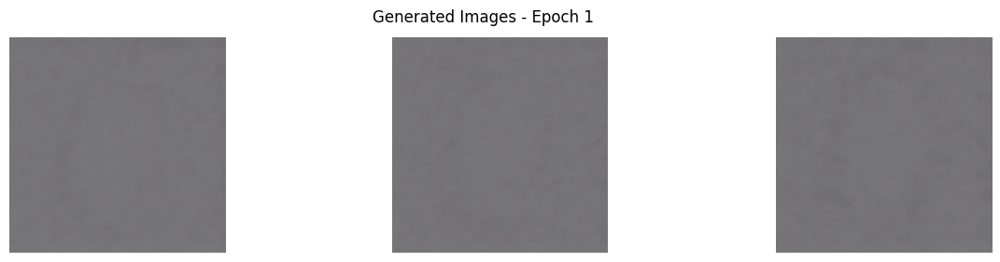

34/34 ━━━━━━━━━━━━━━━━━━━━ 38s 1s/step - d_loss: 1.2180 - g_loss: 0.2964
Epoch 2/50
34/34 ━━━━━━━━━━━━━━━━━━━━ 0s 996ms/step - d_loss: 1.0260 - g_loss: 0.2525

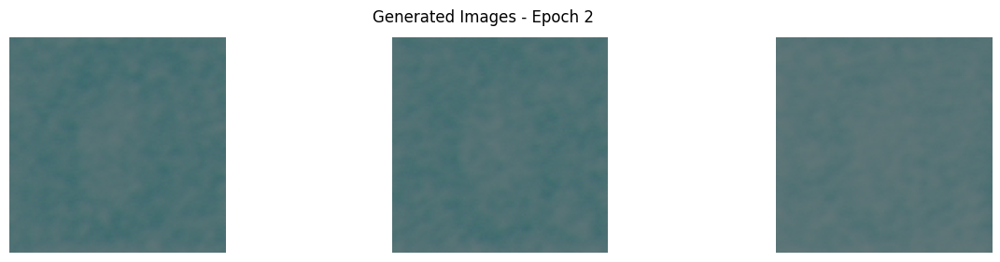

34/34 ━━━━━━━━━━━━━━━━━━━━ 37s 1s/step - d_loss: 1.0246 - g_loss: 0.2454  
Epoch 3/50
34/34 ━━━━━━━━━━━━━━━━━━━━ 0s 1s/step - d_loss: 0.5637 - g_loss: 0.1003

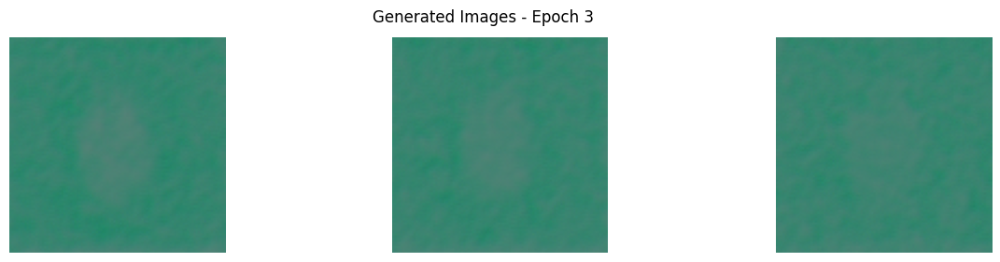

34/34 ━━━━━━━━━━━━━━━━━━━━ 43s 1s/step - d_loss: 0.5682 - g_loss: 0.1004
Epoch 4/50
34/34 ━━━━━━━━━━━━━━━━━━━━ 0s 1s/step - d_loss: 0.3367 - g_loss: 2.1857

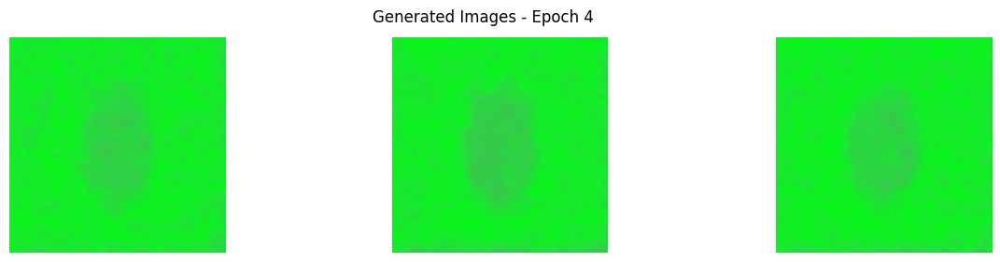

34/34 ━━━━━━━━━━━━━━━━━━━━ 40s 1s/step - d_loss: 0.3366 - g_loss: 2.2503
Epoch 5/50
34/34 ━━━━━━━━━━━━━━━━━━━━ 0s 1s/step - d_loss: 0.2840 - g_loss: 3.6454

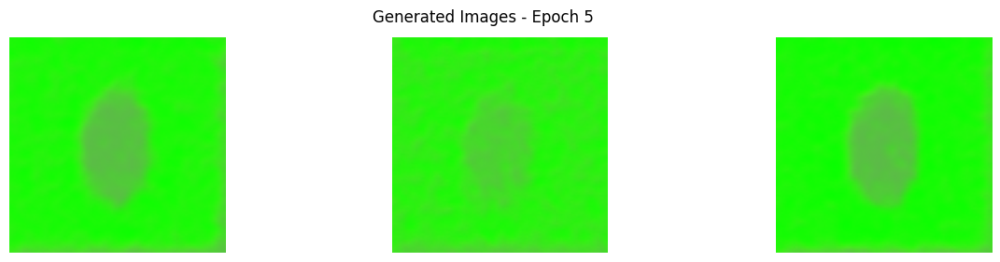

34/34 ━━━━━━━━━━━━━━━━━━━━ 42s 1s/step - d_loss: 0.2837 - g_loss: 3.6364
Epoch 6/50
34/34 ━━━━━━━━━━━━━━━━━━━━ 0s 1s/step - d_loss: 0.2813 - g_loss: 2.8633

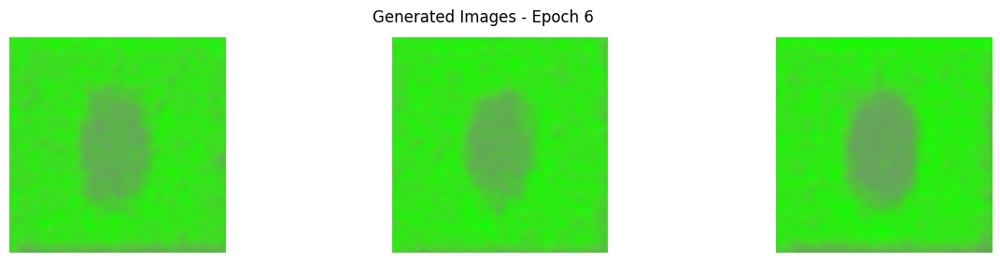

34/34 ━━━━━━━━━━━━━━━━━━━━ 40s 1s/step - d_loss: 0.2816 - g_loss: 2.9023
Epoch 7/50
34/34 ━━━━━━━━━━━━━━━━━━━━ 0s 1s/step - d_loss: 0.2715 - g_loss: 3.1428

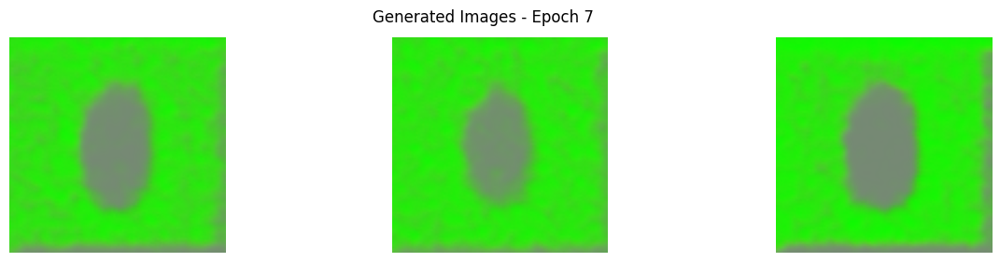

34/34 ━━━━━━━━━━━━━━━━━━━━ 36s 1s/step - d_loss: 0.2712 - g_loss: 3.1350
Epoch 8/50
34/34 ━━━━━━━━━━━━━━━━━━━━ 0s 1s/step - d_loss: 0.2694 - g_loss: 2.7592

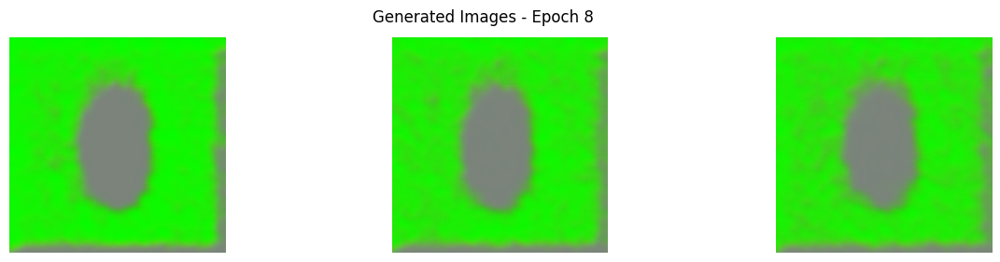

34/34 ━━━━━━━━━━━━━━━━━━━━ 36s 1s/step - d_loss: 0.2684 - g_loss: 2.7667
Epoch 9/50
34/34 ━━━━━━━━━━━━━━━━━━━━ 0s 1s/step - d_loss: 0.2711 - g_loss: 2.9848

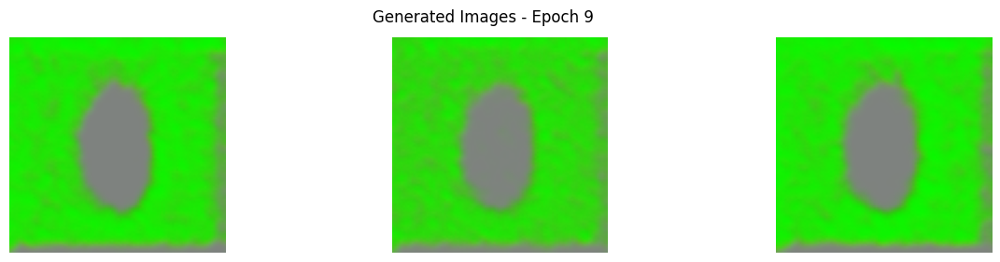

34/34 ━━━━━━━━━━━━━━━━━━━━ 41s 1s/step - d_loss: 0.2700 - g_loss: 2.9910
Epoch 10/50
34/34 ━━━━━━━━━━━━━━━━━━━━ 0s 1s/step - d_loss: 0.2678 - g_loss: 2.7427

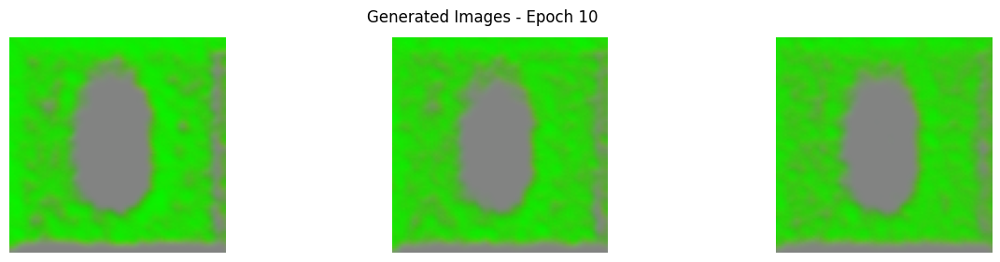

34/34 ━━━━━━━━━━━━━━━━━━━━ 35s 1s/step - d_loss: 0.2679 - g_loss: 2.7568
Epoch 11/50
34/34 ━━━━━━━━━━━━━━━━━━━━ 0s 1s/step - d_loss: 0.2686 - g_loss: 2.7748

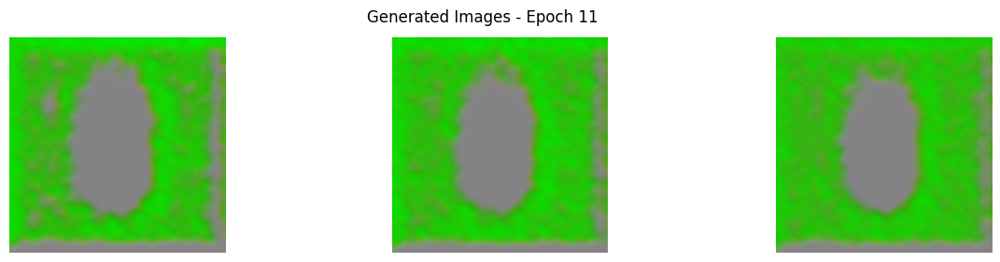

34/34 ━━━━━━━━━━━━━━━━━━━━ 41s 1s/step - d_loss: 0.2685 - g_loss: 2.7894
Epoch 12/50
34/34 ━━━━━━━━━━━━━━━━━━━━ 0s 1s/step - d_loss: 0.2707 - g_loss: 2.4464

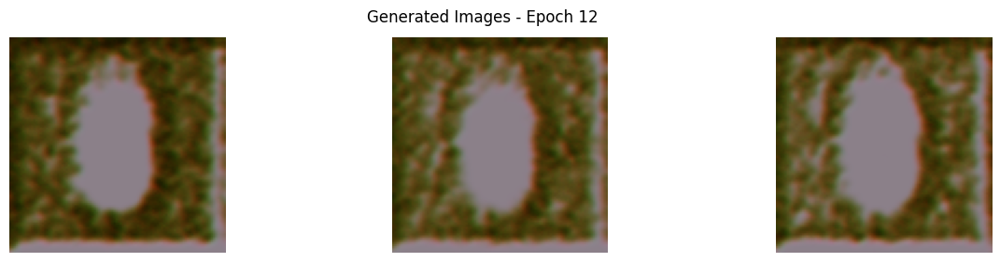

34/34 ━━━━━━━━━━━━━━━━━━━━ 36s 1s/step - d_loss: 0.2709 - g_loss: 2.4558
Epoch 13/50
34/34 ━━━━━━━━━━━━━━━━━━━━ 0s 1s/step - d_loss: 0.2890 - g_loss: 1.7625

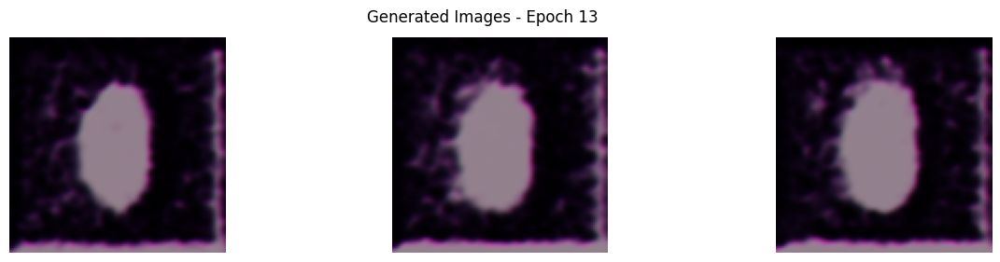

34/34 ━━━━━━━━━━━━━━━━━━━━ 36s 1s/step - d_loss: 0.2896 - g_loss: 1.7716
Epoch 14/50
34/34 ━━━━━━━━━━━━━━━━━━━━ 0s 1s/step - d_loss: 0.2795 - g_loss: 2.1353

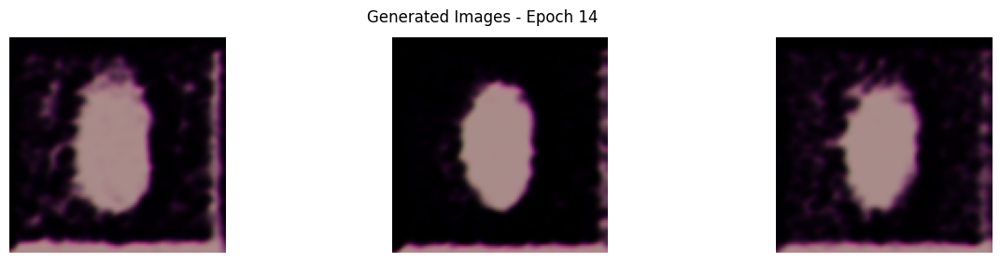

34/34 ━━━━━━━━━━━━━━━━━━━━ 41s 1s/step - d_loss: 0.2794 - g_loss: 2.1509
Epoch 15/50
34/34 ━━━━━━━━━━━━━━━━━━━━ 0s 1s/step - d_loss: 0.2862 - g_loss: 2.0930

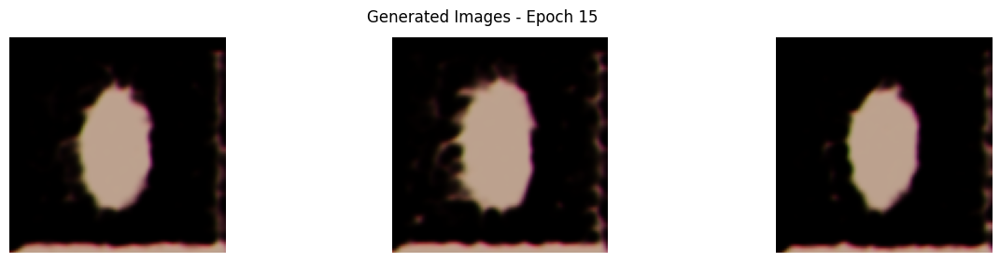

34/34 ━━━━━━━━━━━━━━━━━━━━ 36s 1s/step - d_loss: 0.2865 - g_loss: 2.1093
Epoch 16/50
34/34 ━━━━━━━━━━━━━━━━━━━━ 0s 1s/step - d_loss: 0.2875 - g_loss: 1.9017

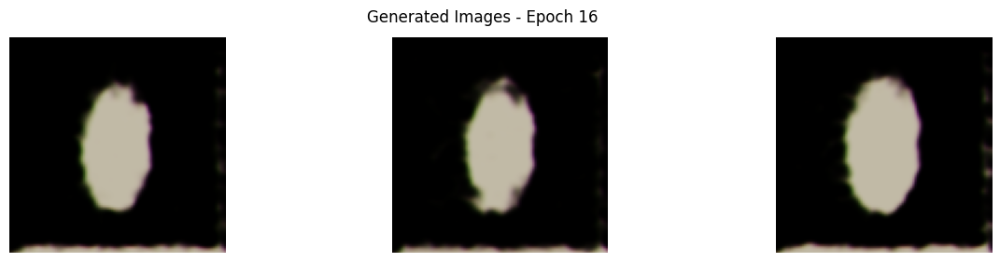

34/34 ━━━━━━━━━━━━━━━━━━━━ 41s 1s/step - d_loss: 0.2888 - g_loss: 1.8964
Epoch 17/50
34/34 ━━━━━━━━━━━━━━━━━━━━ 0s 1s/step - d_loss: 0.3050 - g_loss: 1.6743

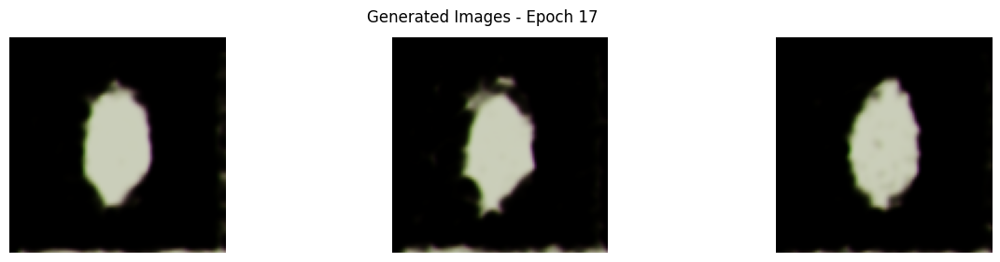

34/34 ━━━━━━━━━━━━━━━━━━━━ 35s 1s/step - d_loss: 0.3052 - g_loss: 1.6780
Epoch 18/50
34/34 ━━━━━━━━━━━━━━━━━━━━ 0s 1s/step - d_loss: 0.3062 - g_loss: 1.3539

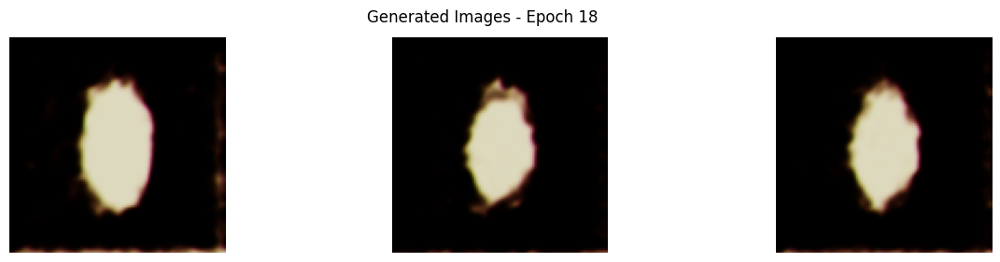

34/34 ━━━━━━━━━━━━━━━━━━━━ 36s 1s/step - d_loss: 0.3075 - g_loss: 1.3566
Epoch 19/50
34/34 ━━━━━━━━━━━━━━━━━━━━ 0s 1s/step - d_loss: 0.3120 - g_loss: 1.2794

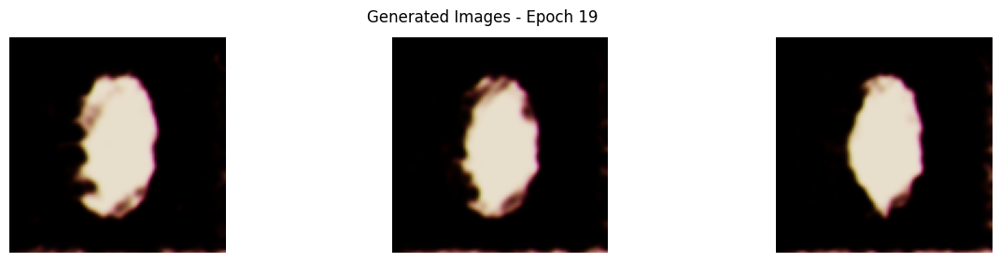

34/34 ━━━━━━━━━━━━━━━━━━━━ 36s 1s/step - d_loss: 0.3137 - g_loss: 1.2691
Epoch 20/50
34/34 ━━━━━━━━━━━━━━━━━━━━ 0s 1s/step - d_loss: 0.3588 - g_loss: 1.1484

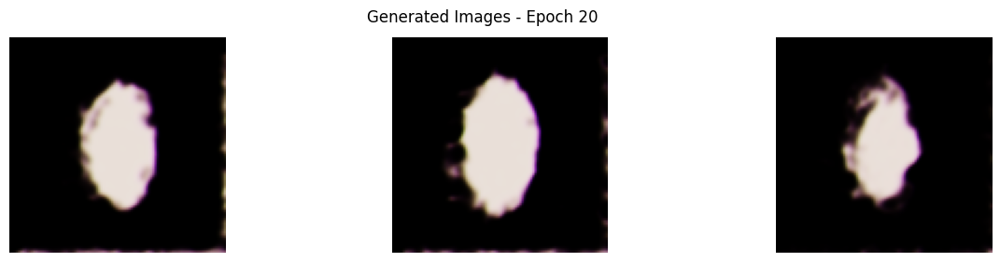

34/34 ━━━━━━━━━━━━━━━━━━━━ 40s 1s/step - d_loss: 0.3606 - g_loss: 1.1775
Epoch 21/50
34/34 ━━━━━━━━━━━━━━━━━━━━ 0s 1s/step - d_loss: 0.3240 - g_loss: 1.1251

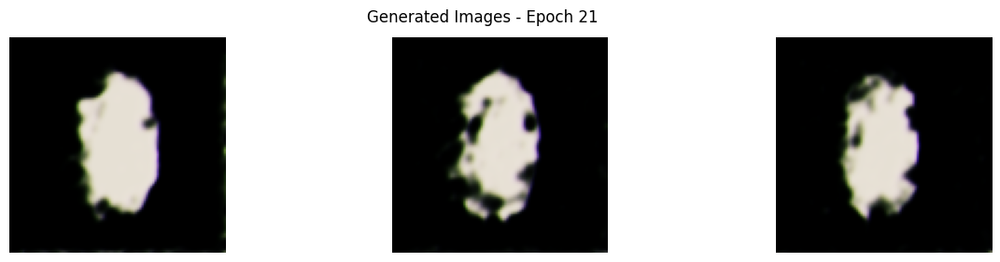

34/34 ━━━━━━━━━━━━━━━━━━━━ 42s 1s/step - d_loss: 0.3253 - g_loss: 1.1167
Epoch 22/50
34/34 ━━━━━━━━━━━━━━━━━━━━ 0s 1s/step - d_loss: 0.3312 - g_loss: 0.9861

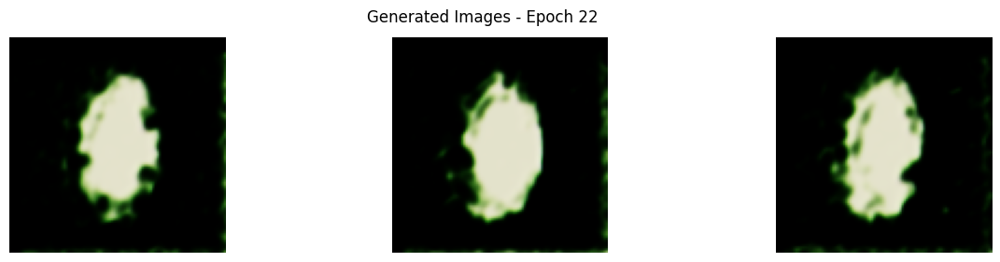

34/34 ━━━━━━━━━━━━━━━━━━━━ 41s 1s/step - d_loss: 0.3314 - g_loss: 0.9814
Epoch 23/50
34/34 ━━━━━━━━━━━━━━━━━━━━ 0s 1s/step - d_loss: 0.3395 - g_loss: 1.0552

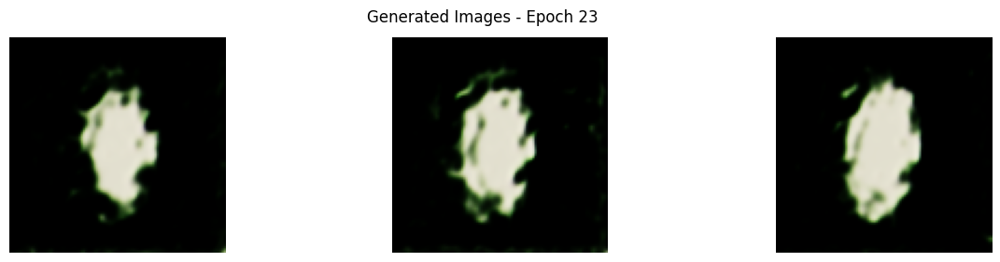

34/34 ━━━━━━━━━━━━━━━━━━━━ 35s 1s/step - d_loss: 0.3393 - g_loss: 1.0483
Epoch 24/50
34/34 ━━━━━━━━━━━━━━━━━━━━ 0s 1s/step - d_loss: 0.3635 - g_loss: 0.8954

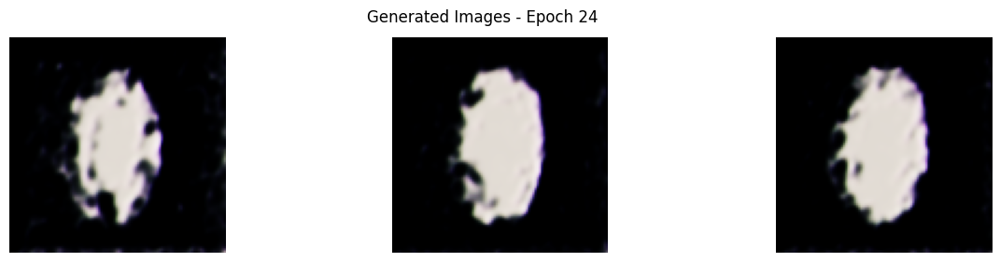

34/34 ━━━━━━━━━━━━━━━━━━━━ 41s 1s/step - d_loss: 0.3630 - g_loss: 0.9146
Epoch 25/50
34/34 ━━━━━━━━━━━━━━━━━━━━ 0s 1s/step - d_loss: 0.3321 - g_loss: 0.9049

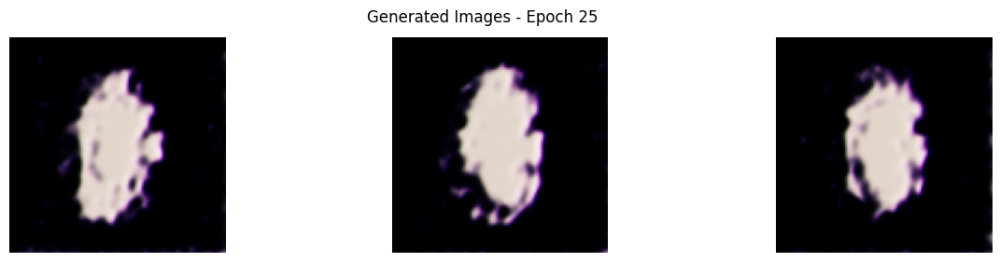

34/34 ━━━━━━━━━━━━━━━━━━━━ 36s 1s/step - d_loss: 0.3325 - g_loss: 0.9055
Epoch 26/50
34/34 ━━━━━━━━━━━━━━━━━━━━ 0s 1s/step - d_loss: 0.3293 - g_loss: 0.9776

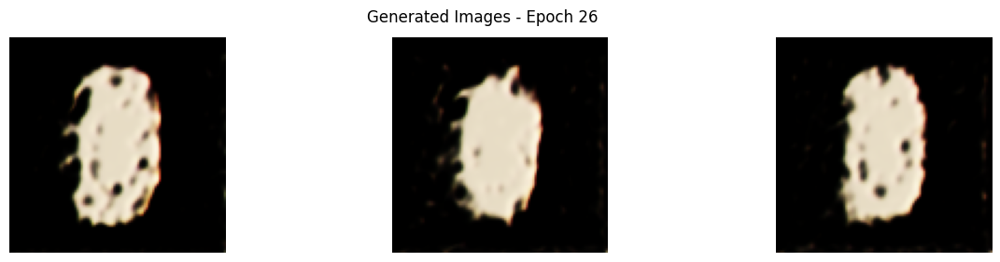

34/34 ━━━━━━━━━━━━━━━━━━━━ 41s 1s/step - d_loss: 0.3309 - g_loss: 0.9650
Epoch 27/50
34/34 ━━━━━━━━━━━━━━━━━━━━ 0s 1s/step - d_loss: 0.3460 - g_loss: 1.0301

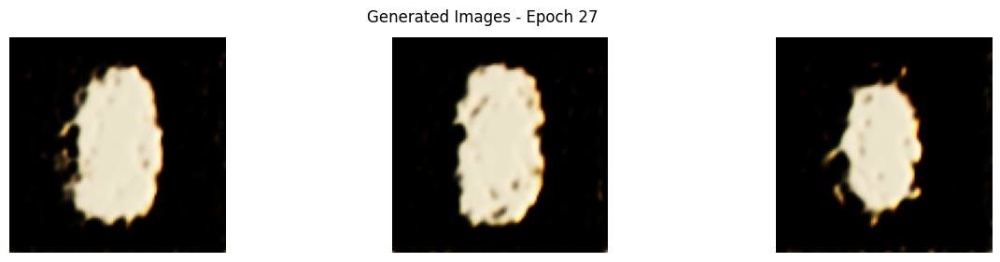

34/34 ━━━━━━━━━━━━━━━━━━━━ 41s 1s/step - d_loss: 0.3461 - g_loss: 1.0751
Epoch 28/50
34/34 ━━━━━━━━━━━━━━━━━━━━ 0s 1s/step - d_loss: 0.3384 - g_loss: 0.9737

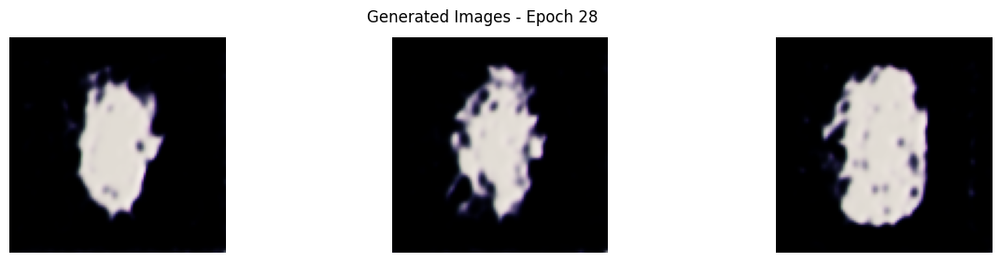

34/34 ━━━━━━━━━━━━━━━━━━━━ 36s 1s/step - d_loss: 0.3391 - g_loss: 0.9900
Epoch 29/50
34/34 ━━━━━━━━━━━━━━━━━━━━ 0s 1s/step - d_loss: 0.3299 - g_loss: 1.0925

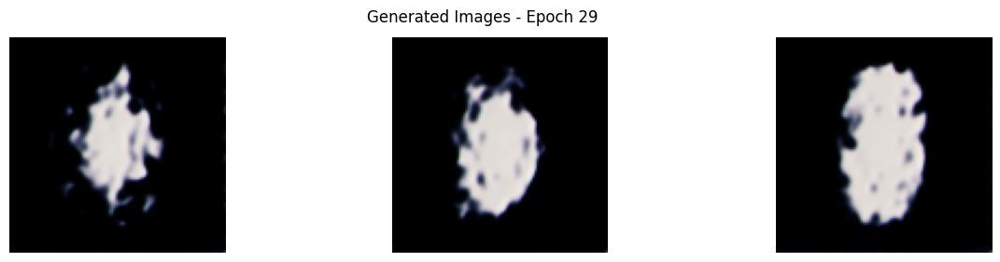

34/34 ━━━━━━━━━━━━━━━━━━━━ 41s 1s/step - d_loss: 0.3311 - g_loss: 1.1051
Epoch 30/50
34/34 ━━━━━━━━━━━━━━━━━━━━ 0s 1s/step - d_loss: 0.3394 - g_loss: 0.8911

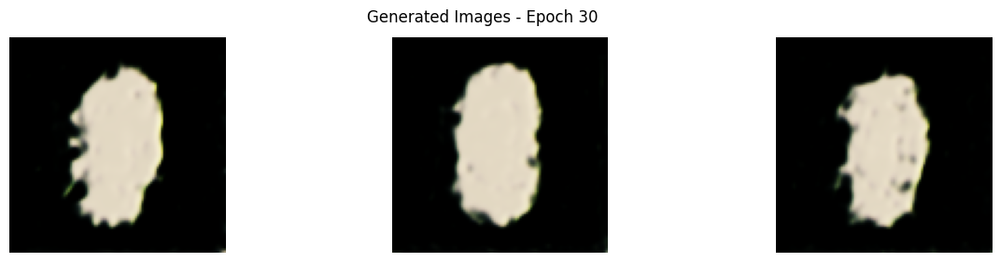

34/34 ━━━━━━━━━━━━━━━━━━━━ 40s 1s/step - d_loss: 0.3408 - g_loss: 0.8799
Epoch 31/50
34/34 ━━━━━━━━━━━━━━━━━━━━ 0s 1s/step - d_loss: 0.3290 - g_loss: 0.8382

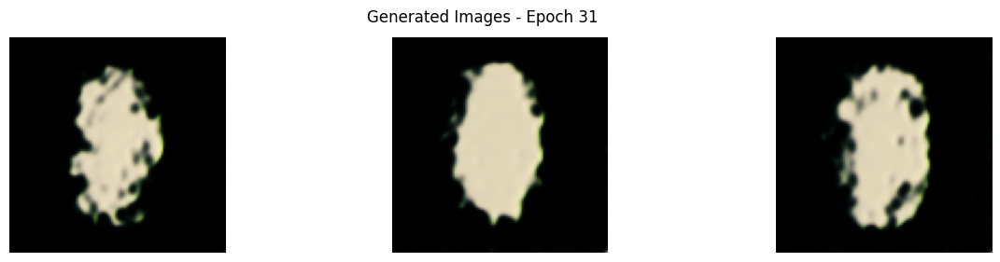

34/34 ━━━━━━━━━━━━━━━━━━━━ 41s 1s/step - d_loss: 0.3291 - g_loss: 0.8605
Epoch 32/50
34/34 ━━━━━━━━━━━━━━━━━━━━ 0s 1s/step - d_loss: 0.3402 - g_loss: 0.9995

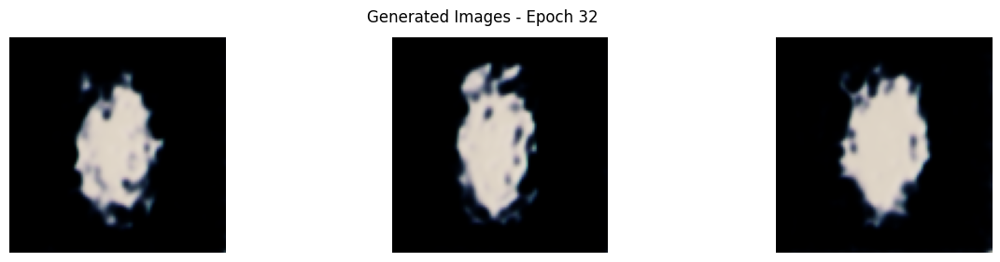

34/34 ━━━━━━━━━━━━━━━━━━━━ 41s 1s/step - d_loss: 0.3406 - g_loss: 1.0184
Epoch 33/50
34/34 ━━━━━━━━━━━━━━━━━━━━ 0s 1s/step - d_loss: 0.3303 - g_loss: 0.7912

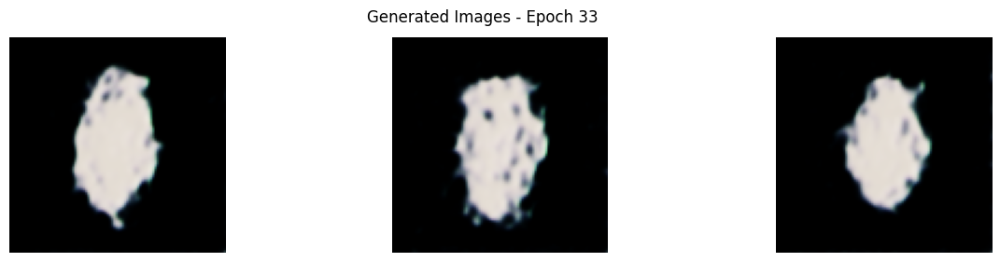

34/34 ━━━━━━━━━━━━━━━━━━━━ 41s 1s/step - d_loss: 0.3311 - g_loss: 0.8119
Epoch 34/50
34/34 ━━━━━━━━━━━━━━━━━━━━ 0s 1s/step - d_loss: 0.3309 - g_loss: 0.8295

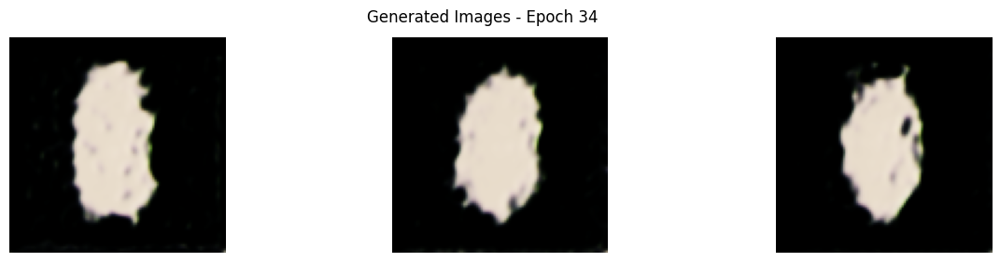

34/34 ━━━━━━━━━━━━━━━━━━━━ 36s 1s/step - d_loss: 0.3314 - g_loss: 0.8458
Epoch 35/50
34/34 ━━━━━━━━━━━━━━━━━━━━ 0s 1s/step - d_loss: 0.3383 - g_loss: 0.8082

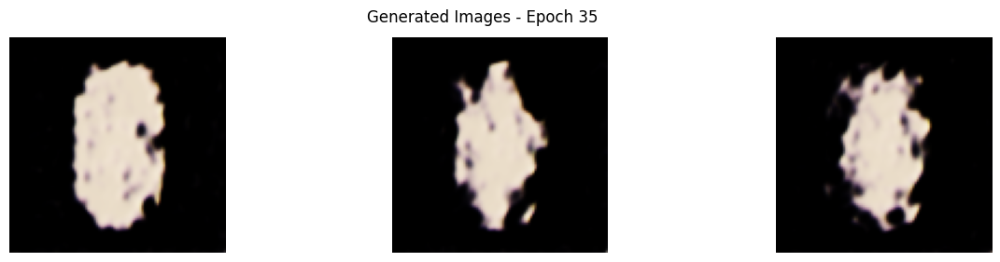

34/34 ━━━━━━━━━━━━━━━━━━━━ 36s 1s/step - d_loss: 0.3385 - g_loss: 0.8096
Epoch 36/50
34/34 ━━━━━━━━━━━━━━━━━━━━ 0s 1s/step - d_loss: 0.3169 - g_loss: 0.8712

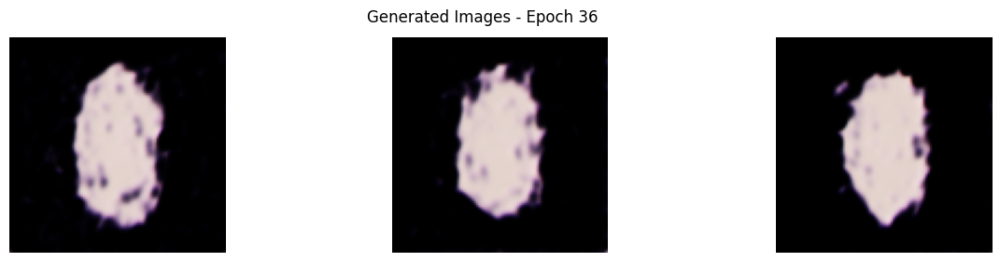

34/34 ━━━━━━━━━━━━━━━━━━━━ 40s 1s/step - d_loss: 0.3175 - g_loss: 0.8653
Epoch 37/50
34/34 ━━━━━━━━━━━━━━━━━━━━ 0s 1s/step - d_loss: 0.3176 - g_loss: 0.8781

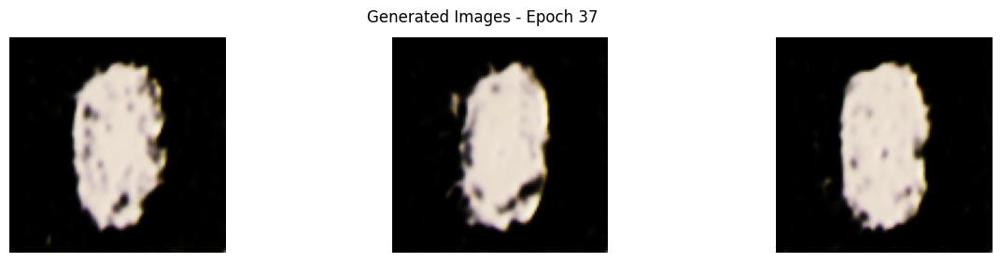

34/34 ━━━━━━━━━━━━━━━━━━━━ 42s 1s/step - d_loss: 0.3182 - g_loss: 0.8788
Epoch 38/50
34/34 ━━━━━━━━━━━━━━━━━━━━ 0s 1s/step - d_loss: 0.3134 - g_loss: 0.8635

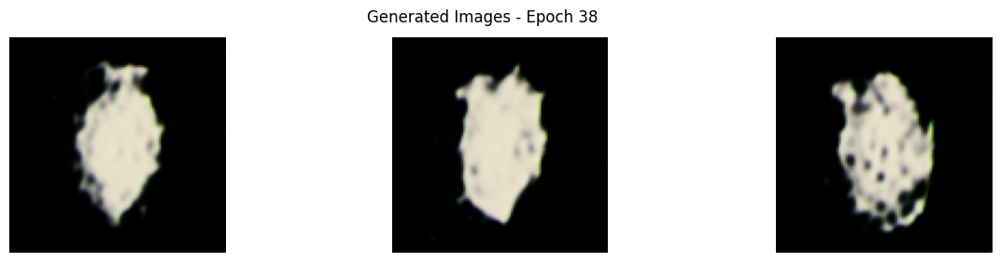

34/34 ━━━━━━━━━━━━━━━━━━━━ 36s 1s/step - d_loss: 0.3153 - g_loss: 0.8647
Epoch 39/50
34/34 ━━━━━━━━━━━━━━━━━━━━ 0s 1s/step - d_loss: 0.3196 - g_loss: 0.8980

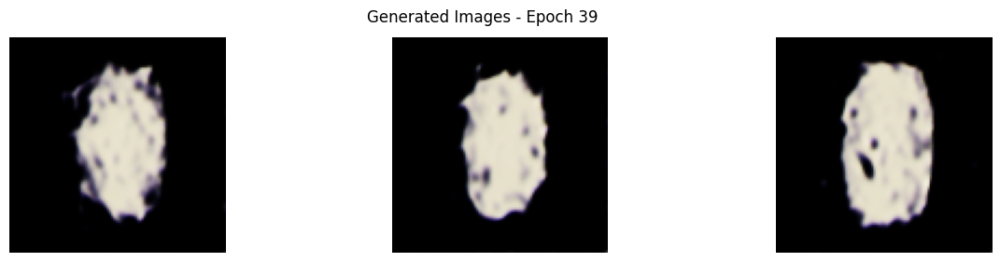

34/34 ━━━━━━━━━━━━━━━━━━━━ 41s 1s/step - d_loss: 0.3196 - g_loss: 0.8904
Epoch 40/50
34/34 ━━━━━━━━━━━━━━━━━━━━ 0s 1s/step - d_loss: 0.3234 - g_loss: 0.9663

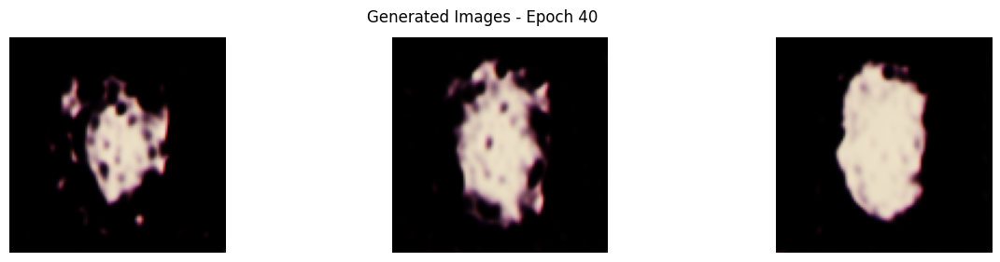

34/34 ━━━━━━━━━━━━━━━━━━━━ 36s 1s/step - d_loss: 0.3249 - g_loss: 0.9517
Epoch 41/50
34/34 ━━━━━━━━━━━━━━━━━━━━ 0s 1s/step - d_loss: 0.3211 - g_loss: 0.9347

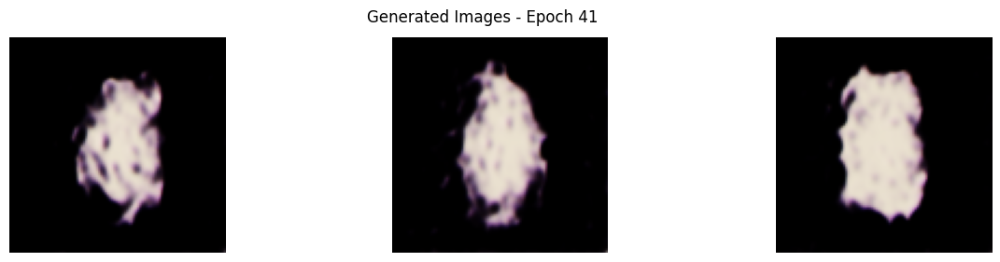

34/34 ━━━━━━━━━━━━━━━━━━━━ 41s 1s/step - d_loss: 0.3223 - g_loss: 0.9310
Epoch 42/50
34/34 ━━━━━━━━━━━━━━━━━━━━ 0s 1s/step - d_loss: 0.3248 - g_loss: 0.8994

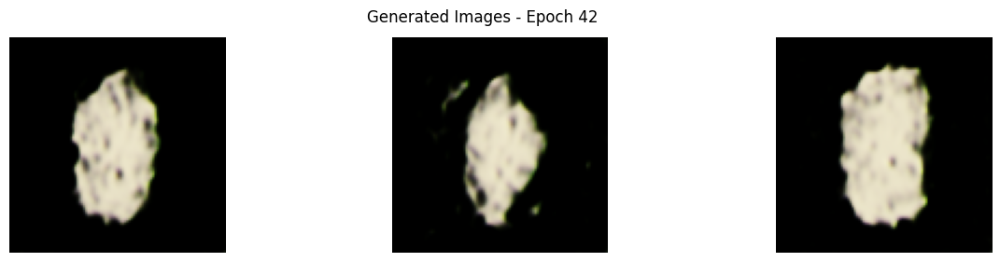

34/34 ━━━━━━━━━━━━━━━━━━━━ 40s 1s/step - d_loss: 0.3263 - g_loss: 0.9155
Epoch 43/50
34/34 ━━━━━━━━━━━━━━━━━━━━ 0s 1s/step - d_loss: 0.3244 - g_loss: 0.9015

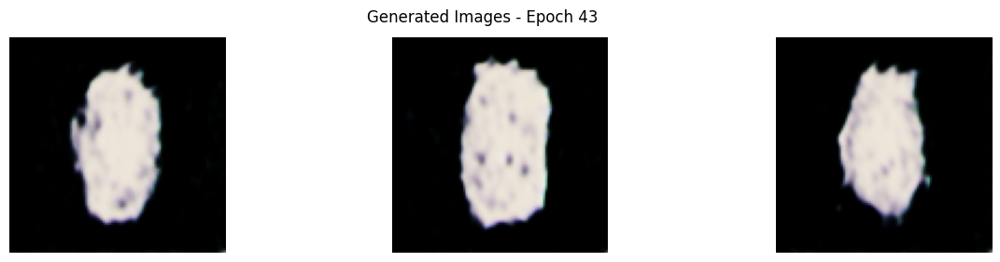

34/34 ━━━━━━━━━━━━━━━━━━━━ 36s 1s/step - d_loss: 0.3261 - g_loss: 0.9082
Epoch 44/50
34/34 ━━━━━━━━━━━━━━━━━━━━ 0s 1s/step - d_loss: 0.3273 - g_loss: 0.8961

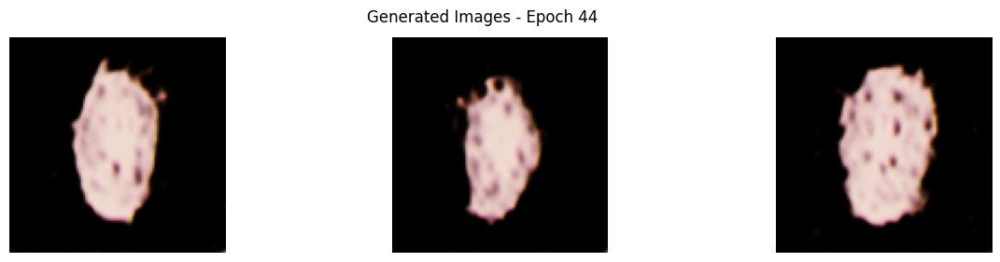

34/34 ━━━━━━━━━━━━━━━━━━━━ 41s 1s/step - d_loss: 0.3275 - g_loss: 0.8975
Epoch 45/50
34/34 ━━━━━━━━━━━━━━━━━━━━ 0s 1s/step - d_loss: 0.3146 - g_loss: 1.0584

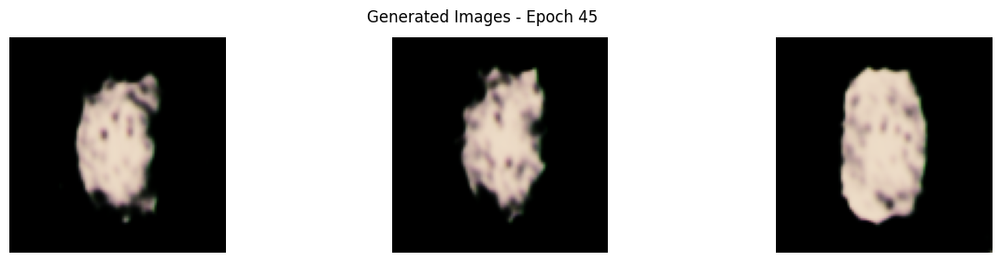

34/34 ━━━━━━━━━━━━━━━━━━━━ 41s 1s/step - d_loss: 0.3147 - g_loss: 1.0499
Epoch 46/50
34/34 ━━━━━━━━━━━━━━━━━━━━ 0s 1s/step - d_loss: 0.3408 - g_loss: 0.6830

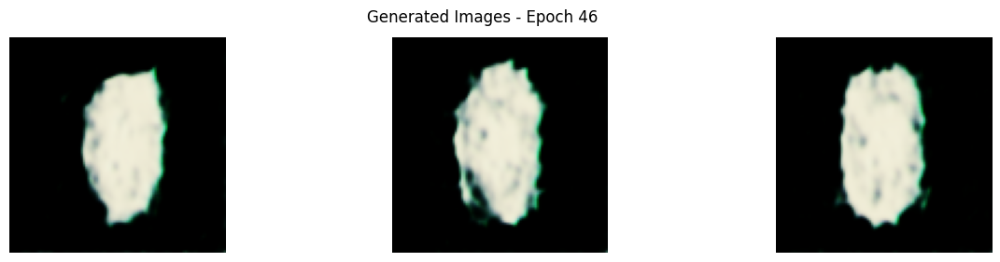

34/34 ━━━━━━━━━━━━━━━━━━━━ 36s 1s/step - d_loss: 0.3407 - g_loss: 0.6748
Epoch 47/50
34/34 ━━━━━━━━━━━━━━━━━━━━ 0s 1s/step - d_loss: 0.3210 - g_loss: 0.7850

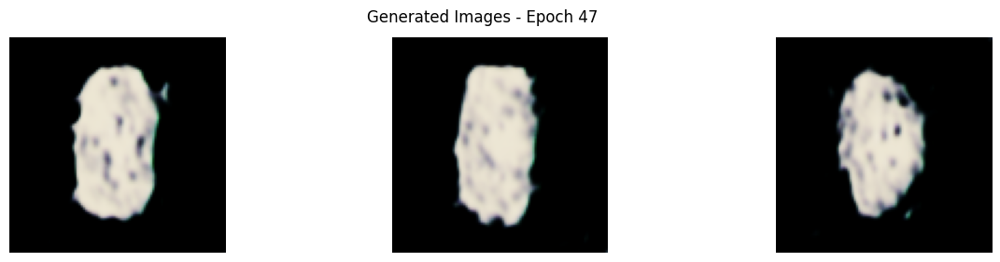

34/34 ━━━━━━━━━━━━━━━━━━━━ 37s 1s/step - d_loss: 0.3220 - g_loss: 0.7831
Epoch 48/50
34/34 ━━━━━━━━━━━━━━━━━━━━ 0s 1s/step - d_loss: 0.3257 - g_loss: 0.8583

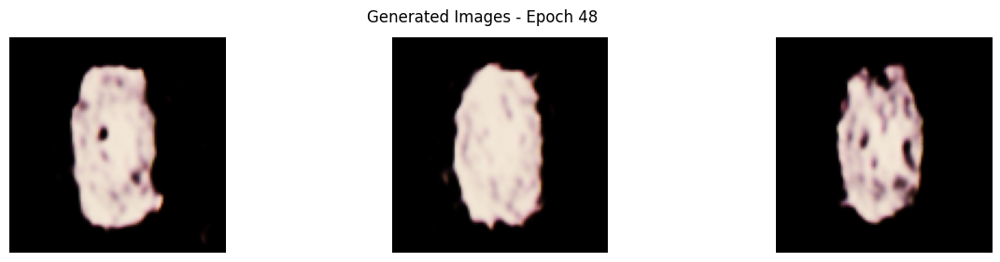

34/34 ━━━━━━━━━━━━━━━━━━━━ 36s 1s/step - d_loss: 0.3268 - g_loss: 0.8569
Epoch 49/50
34/34 ━━━━━━━━━━━━━━━━━━━━ 0s 1s/step - d_loss: 0.3268 - g_loss: 0.8044

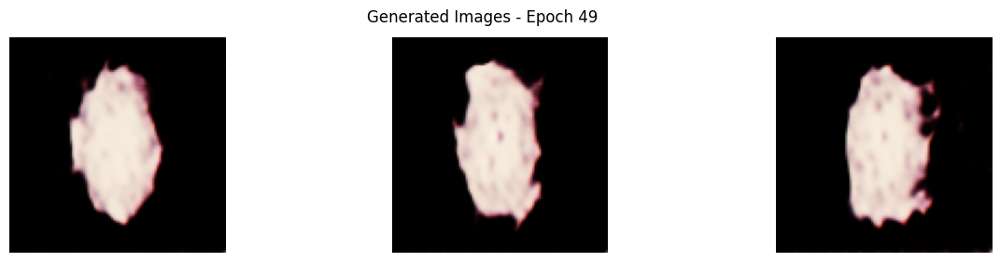

34/34 ━━━━━━━━━━━━━━━━━━━━ 42s 1s/step - d_loss: 0.3258 - g_loss: 0.7936
Epoch 50/50
34/34 ━━━━━━━━━━━━━━━━━━━━ 0s 1s/step - d_loss: 0.3255 - g_loss: 0.7950

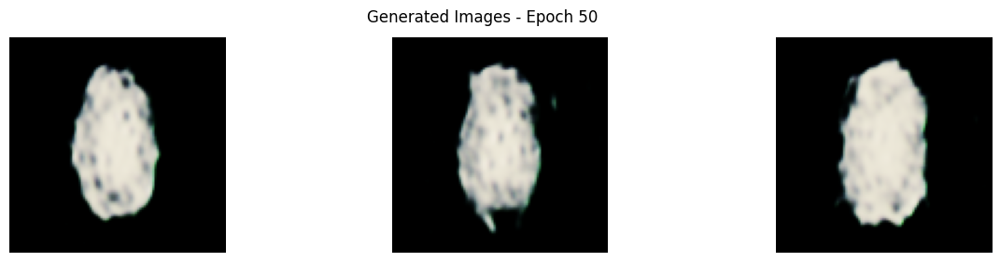

34/34 ━━━━━━━━━━━━━━━━━━━━ 41s 1s/step - d_loss: 0.3266 - g_loss: 0.7857


In [135]:
history = gan.fit(x, epochs=50, callbacks=[ModelMonitor()])

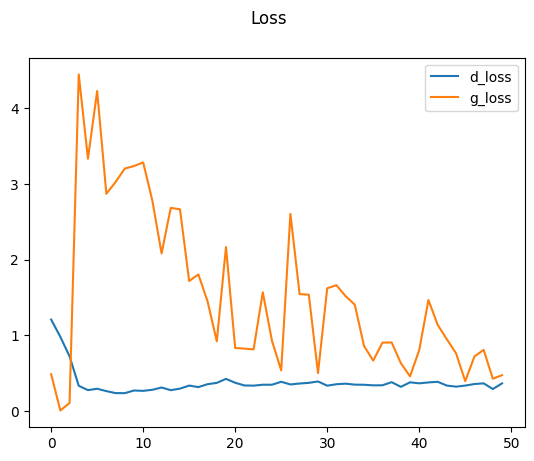

In [136]:
plt.suptitle('Loss')
plt.plot(history.history['d_loss'], label='d_loss')
plt.plot(history.history['g_loss'], label='g_loss')
plt.legend()
plt.show()

### G loss mulai perlahan turun seiring berjalannya epoch, mulai bisa mengecoh dengan baik (loss yang semakin rendah), lalu D loss turun dan stabil, berarti D sudah belajar membedakan real dan fake dengan baik

### Tetapi, G loss masih fluktuatif, belum stabil belajar. Sedangkan D loss terlalu rendah terus menerus, terlalu dominan hingga G kesulitan belajar.

### APakah hasilnya bagus? bisa dibilang lumayan, dan proses menuju bagus, walau belum ada hasilnya.
### mungkin dengan epoch yang lebih banyak, ada kemungkinan model perform lebih baik. Namun, dari plot memang bisa dilihat G belum konsisten dan D loss masih terlalu kecil (kemungkinan karena G belum berkembang)

In [154]:
def show_generated_images(images, title, n=10):
    plt.figure(figsize=(15, 2))
    for i in range(n):
        plt.subplot(1, n, i + 1)
        plt.imshow((images[i] + 1) / 2.0)
        plt.axis('off')
    plt.suptitle(title)
    plt.show()

In [138]:
from tensorflow.keras.applications.inception_v3 import InceptionV3, preprocess_input
from scipy.linalg import sqrtm
def calculate_fid(real, generated):
    model = InceptionV3(include_top=False, pooling='avg', input_shape=(299, 299, 3))

    # Resize ke 299x299 dulu
    real = tf.image.resize(real, (299, 299))
    generated = tf.image.resize(generated, (299, 299))

    real = preprocess_input((real + 1) * 127.5)
    generated = preprocess_input((generated + 1) * 127.5)

    act1 = model.predict(real, batch_size=32)
    act2 = model.predict(generated, batch_size=32)

    mu1, sigma1 = act1.mean(axis=0), np.cov(act1, rowvar=False)
    mu2, sigma2 = act2.mean(axis=0), np.cov(act2, rowvar=False)

    # Frechet Distance
    ssdiff = np.sum((mu1 - mu2)**2)
    covmean = sqrtm(sigma1.dot(sigma2))
    if np.iscomplexobj(covmean):
        covmean = covmean.real

    return ssdiff + np.trace(sigma1 + sigma2 - 2 * covmean)

### FID itu metrik untuk mengukur seberapa mirip distribusi gambar yang dihasilkan oleh generator (fake) dengan gambar nyata (real)

In [139]:
real_images = x[:100]  # misalnya ambil 100 sample
# Generated images: generate dari noise
noise = tf.random.normal((100, 100))
generated_images = generator(noise, training=False)

fid_score = calculate_fid(real_images, generated_images)
print("FID Score:", fid_score)

4/4 ━━━━━━━━━━━━━━━━━━━━ 21s 4s/step
4/4 ━━━━━━━━━━━━━━━━━━━━ 16s 4s/step
FID Score: 342.90667255688436


### Hasil baseline masih kurang bagus performanya, dari hasil FID yang di angka 342, berarti kualitas fake image masih sangat buruk dibanding real image, sehingga perlu adanya improvement dan epoch yang lebih banyak

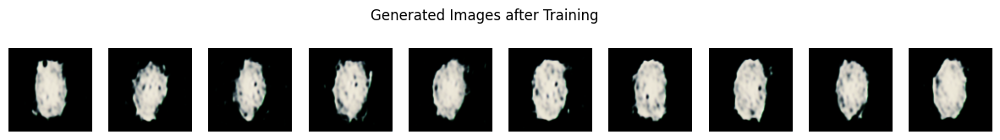

In [140]:
show_generated_images(generated_images, "Generated Images after Training")

In [155]:
def show_real_vs_generated(real_images, generated_images, title="Comparison", n=5):

    plt.figure(figsize=(n * 2.5, 5))

    for i in range(n):
        ax = plt.subplot(2, n, i + 1)
        plt.imshow(real_images[i])
        plt.axis('off')
        if i == n // 2:
            ax.set_title("Real vs Generated")

        ax = plt.subplot(2, n, i + 1 + n)
        plt.imshow(generated_images[i])
        plt.axis('off')

    plt.tight_layout()
    plt.suptitle(title, fontsize=16)
    plt.subplots_adjust(top=0.85)
    plt.show()

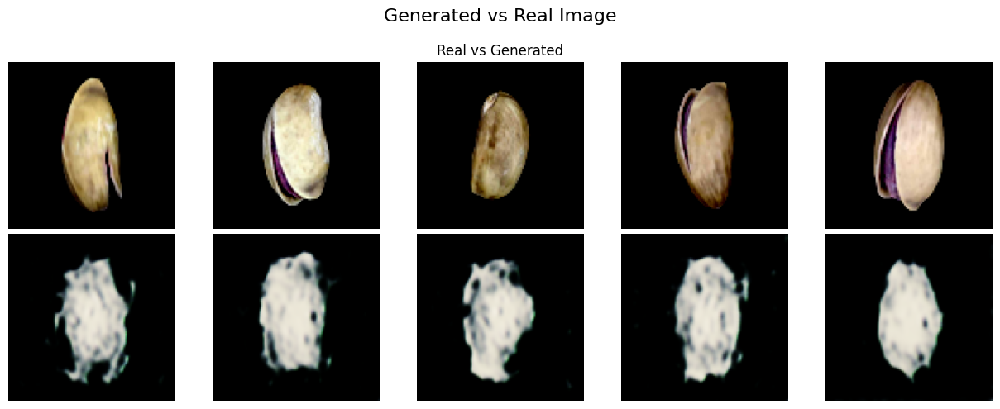

In [156]:
show_real_vs_generated(
    real_images[:5],
    ((generator(tf.random.normal((5, 100))) + 1) / 2).numpy(),
    title="Generated vs Real Image"
)

# Modified

### Membuat less complex model, dengan neuron yang lebih sedikit

In [238]:
def build_mod_generator(noise_dim):

    inputs = Input(shape=(noise_dim,))

    x = Dense(108 * 108 * 3)(inputs)
    x = Activation('relu')(x)
    x = Reshape((108, 108, 3))(x)

    x = Conv2D(8, (3, 3), strides=1, padding='valid')(x)
    x = Activation('relu')(x)

    x = Conv2D(16, (3, 3), strides=1, padding='valid')(x)
    x = Activation('relu')(x)

    x = Conv2D(32, (3, 3), strides=1, padding='valid')(x)
    x = Activation('relu')(x)

    x = Conv2D(3, (3, 3), strides=1, padding='valid')(x)
    outputs = Activation('tanh')(x)

    generator = Model(inputs, outputs, name='Generator')
    generator.summary()

    return generator

In [239]:
def build_mod_discriminator(input_shape=(100, 100, 3)):
    inputs = Input(shape=input_shape)

    x = Conv2D(8, (3, 3), strides=1, padding='valid')(inputs)
    x = Activation('relu')(x)

    x = Conv2D(16, (3, 3), strides=1, padding='valid')(inputs)
    x = Activation('relu')(x)

    x = Conv2D(32, (3, 3), strides=1, padding='valid')(x)
    x = Activation('relu')(x)

    x = Flatten()(x)
    outputs = Dense(1, activation='sigmoid')(x)

    discriminator = Model(inputs, outputs, name='Discriminator')
    discriminator.summary()

    return discriminator

### Menambah latent Dimension ke 200, dengan tujuan melakukan rekonstruksi lebih detail

In [240]:
latent_dim = 200
mod_generator = build_mod_generator(latent_dim)
mod_discriminator = build_mod_discriminator()

Model: "Generator"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ input_layer_45 (InputLayer)     │ (None, 200)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_39 (Dense)                │ (None, 34992)          │     7,033,392 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ activation_695 (Activation)     │ (None, 34992)          │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ reshape_20 (Reshape)            │ (None, 108, 108, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_703 (Conv2D)             │ (None, 106, 106, 8)    │           224 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ activation_696 (Activation)     │ (None, 106, 106, 8)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_704 (Conv2D)             │ (None, 104, 104, 16)   │         1,168 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ activation_697 (Activation)     │ (None, 104, 104, 16)   │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_705 (Conv2D)             │ (None, 102, 102, 32)   │         4,640 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ activation_698 (Activation)     │ (None, 102, 102, 32)   │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_706 (Conv2D)             │ (None, 100, 100, 3)    │           867 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ activation_699 (Activation)     │ (None, 100, 100, 3)    │             0 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,040,291 (26.86 MB)

 Trainable params: 7,040,291 (26.86 MB)

 Non-trainable params: 0 (0.00 B)

Model: "Discriminator"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ input_layer_46 (InputLayer)     │ (None, 100, 100, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_708 (Conv2D)             │ (None, 98, 98, 16)     │           448 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ activation_701 (Activation)     │ (None, 98, 98, 16)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_709 (Conv2D)             │ (None, 96, 96, 32)     │         4,640 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ activation_702 (Activation)     │ (None, 96, 96, 32)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten_19 (Flatten)            │ (None, 294912)         │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_40 (Dense)                │ (None, 1)              │       294,913 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 300,001 (1.14 MB)

 Trainable params: 300,001 (1.14 MB)

 Non-trainable params: 0 (0.00 B)

In [241]:
class mod_GAN(Model):
    def __init__(self, generator, discriminator, *args, **kwargs):
        super().__init__(*args, **kwargs)

        self.generator = generator
        self.discriminator = discriminator
        self.latent_dim = latent_dim

    def compile(self, g_opt, d_opt, g_loss, d_loss, *args, **kwargs):
        super().compile(*args, **kwargs)

        self.g_opt = g_opt
        self.d_opt = d_opt
        self.g_loss = g_loss
        self.d_loss = d_loss

    def train_step(self, batch):
        real_images = batch
        fake_images = self.generator(tf.random.normal((3, self.latent_dim)), training=False)

        with tf.GradientTape() as d_tape:
            yhat_real = self.discriminator(real_images, training=True)
            yhat_fake = self.discriminator(fake_images, training=True)
            yhat_realfake = tf.concat([yhat_real, yhat_fake], axis=0)

            y_realfake = tf.concat([tf.zeros_like(yhat_real), tf.ones_like(yhat_fake)], axis=0)

            noise_real = 0.15*tf.random.uniform(tf.shape(yhat_real))
            noise_fake = -0.15*tf.random.uniform(tf.shape(yhat_fake))
            y_realfake += tf.concat([noise_real, noise_fake], axis=0)

            total_d_loss = self.d_loss(y_realfake, yhat_realfake)

        dgrad = d_tape.gradient(total_d_loss, self.discriminator.trainable_variables)
        self.d_opt.apply_gradients(zip(dgrad, self.discriminator.trainable_variables))

        with tf.GradientTape() as g_tape:
            gen_images = self.generator(tf.random.normal((3,self.latent_dim)), training=True)

            predicted_labels = self.discriminator(gen_images, training=False)

            total_g_loss = self.g_loss(tf.zeros_like(predicted_labels), predicted_labels)

        ggrad = g_tape.gradient(total_g_loss, self.generator.trainable_variables)
        self.g_opt.apply_gradients(zip(ggrad, self.generator.trainable_variables))

        return {"d_loss":total_d_loss, "g_loss":total_g_loss}

In [242]:
mod_d_optimizer = Adam(0.0001)
mod_g_optimizer = Adam(0.0001)
g_loss = tf.keras.losses.BinaryCrossentropy()
d_loss = tf.keras.losses.BinaryCrossentropy()

In [243]:
mod_gan = mod_GAN(mod_generator, mod_discriminator)
mod_gan.compile(mod_g_optimizer, mod_d_optimizer, g_loss, d_loss)

In [244]:
class mod_ModelMonitor(Callback):
    def __init__(self, num_img=3, latent_dim=200):
        self.num_img = num_img
        self.latent_dim = latent_dim

    def on_epoch_end(self, epoch, logs=None):
        noise = tf.random.normal((self.num_img, self.latent_dim))
        generated = self.model.generator(noise, training=False)
        generated = (generated + 1.0) / 2.0  # dari [-1, 1] → [0, 1]

        plt.figure(figsize=(15, 3))
        for i in range(self.num_img):
            plt.subplot(1, self.num_img, i + 1)
            plt.imshow(generated[i].numpy())
            plt.axis('off')
        plt.suptitle(f"Generated Images - Epoch {epoch+1}")
        plt.show()

Epoch 1/50
34/34 ━━━━━━━━━━━━━━━━━━━━ 0s 371ms/step - d_loss: 0.3602 - g_loss: 0.6977

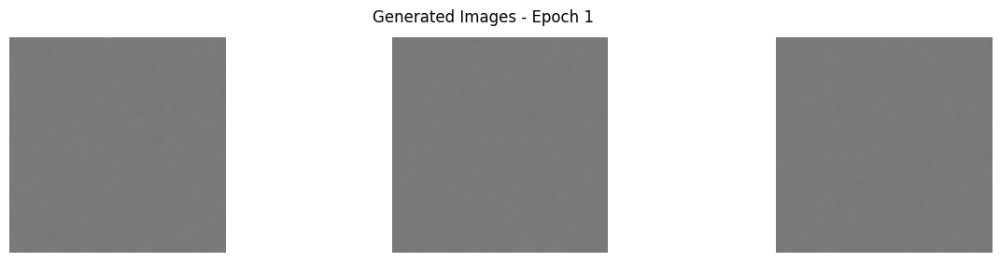

34/34 ━━━━━━━━━━━━━━━━━━━━ 15s 375ms/step - d_loss: 0.3594 - g_loss: 0.7001
Epoch 2/50
34/34 ━━━━━━━━━━━━━━━━━━━━ 0s 366ms/step - d_loss: 0.2911 - g_loss: 1.0634

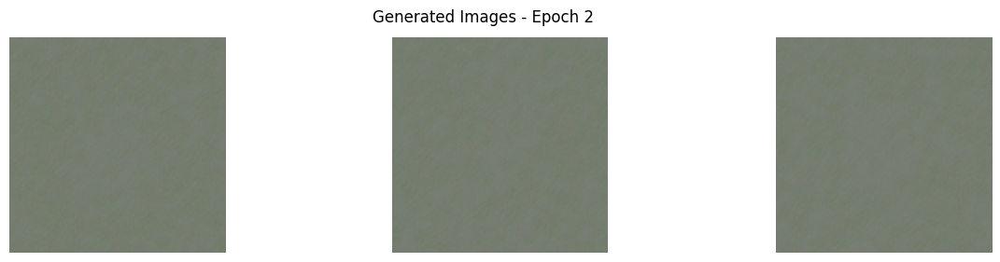

34/34 ━━━━━━━━━━━━━━━━━━━━ 13s 371ms/step - d_loss: 0.2910 - g_loss: 1.0759
Epoch 3/50
34/34 ━━━━━━━━━━━━━━━━━━━━ 0s 365ms/step - d_loss: 0.2681 - g_loss: 2.0493

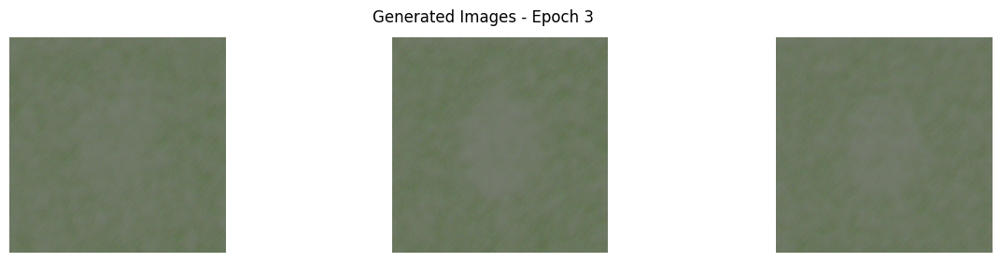

34/34 ━━━━━━━━━━━━━━━━━━━━ 20s 370ms/step - d_loss: 0.2679 - g_loss: 2.0632
Epoch 4/50
34/34 ━━━━━━━━━━━━━━━━━━━━ 0s 368ms/step - d_loss: 0.2683 - g_loss: 2.4897

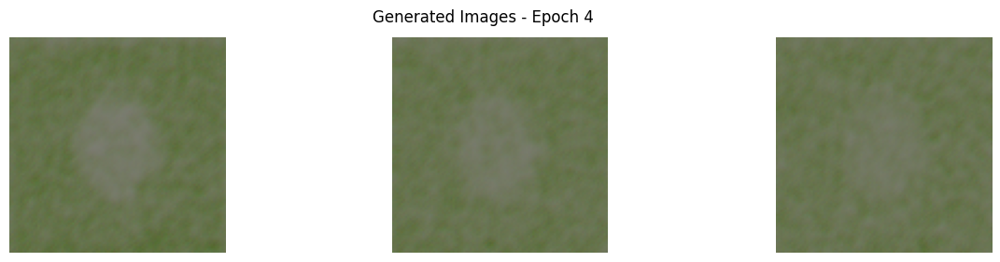

34/34 ━━━━━━━━━━━━━━━━━━━━ 13s 373ms/step - d_loss: 0.2673 - g_loss: 2.4870
Epoch 5/50
34/34 ━━━━━━━━━━━━━━━━━━━━ 0s 368ms/step - d_loss: 0.2661 - g_loss: 2.5280

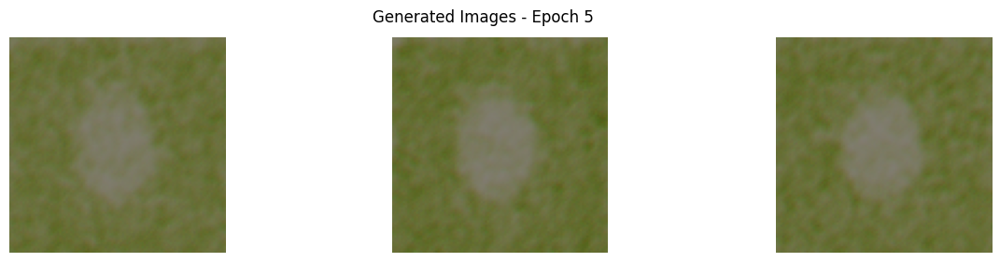

34/34 ━━━━━━━━━━━━━━━━━━━━ 13s 374ms/step - d_loss: 0.2664 - g_loss: 2.5368
Epoch 6/50
34/34 ━━━━━━━━━━━━━━━━━━━━ 0s 372ms/step - d_loss: 0.2695 - g_loss: 2.4213

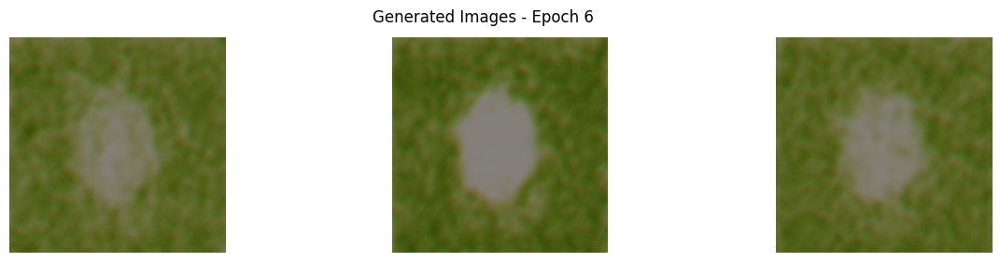

34/34 ━━━━━━━━━━━━━━━━━━━━ 21s 379ms/step - d_loss: 0.2699 - g_loss: 2.3943
Epoch 7/50
34/34 ━━━━━━━━━━━━━━━━━━━━ 0s 373ms/step - d_loss: 0.2745 - g_loss: 2.2868

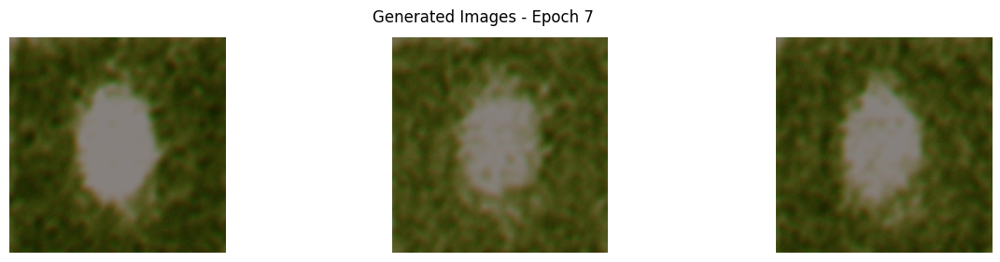

34/34 ━━━━━━━━━━━━━━━━━━━━ 13s 380ms/step - d_loss: 0.2745 - g_loss: 2.2930
Epoch 8/50
34/34 ━━━━━━━━━━━━━━━━━━━━ 0s 376ms/step - d_loss: 0.2769 - g_loss: 1.9933

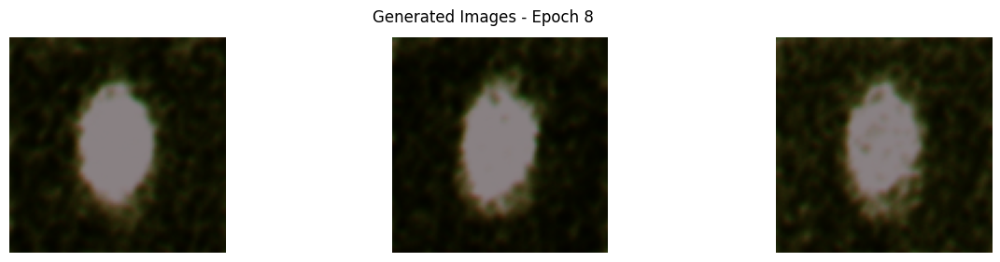

34/34 ━━━━━━━━━━━━━━━━━━━━ 20s 381ms/step - d_loss: 0.2778 - g_loss: 1.9814
Epoch 9/50
34/34 ━━━━━━━━━━━━━━━━━━━━ 0s 385ms/step - d_loss: 0.2733 - g_loss: 2.1024

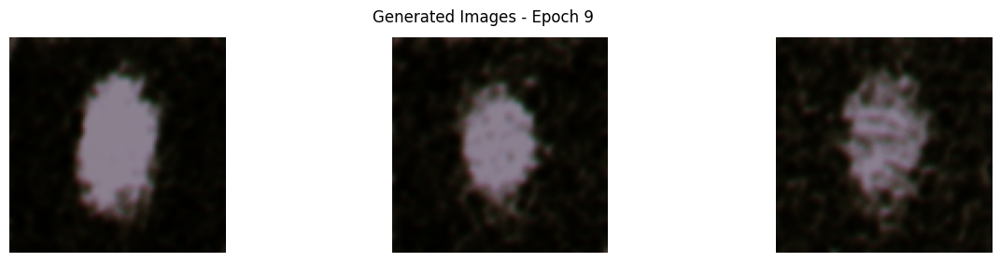

34/34 ━━━━━━━━━━━━━━━━━━━━ 13s 391ms/step - d_loss: 0.2732 - g_loss: 2.0994
Epoch 10/50
34/34 ━━━━━━━━━━━━━━━━━━━━ 0s 377ms/step - d_loss: 0.2727 - g_loss: 2.2567

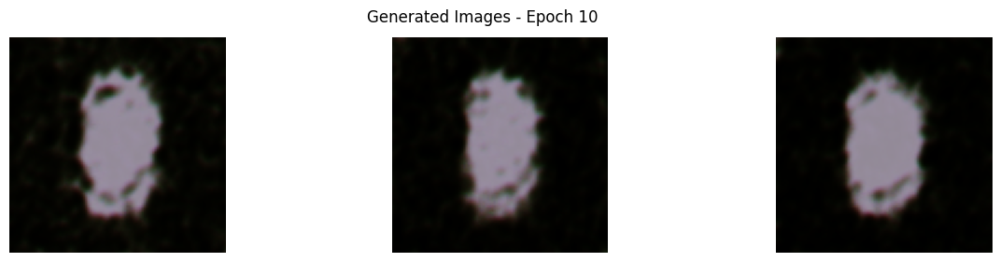

34/34 ━━━━━━━━━━━━━━━━━━━━ 20s 381ms/step - d_loss: 0.2717 - g_loss: 2.2568
Epoch 11/50
34/34 ━━━━━━━━━━━━━━━━━━━━ 0s 379ms/step - d_loss: 0.2805 - g_loss: 2.0498

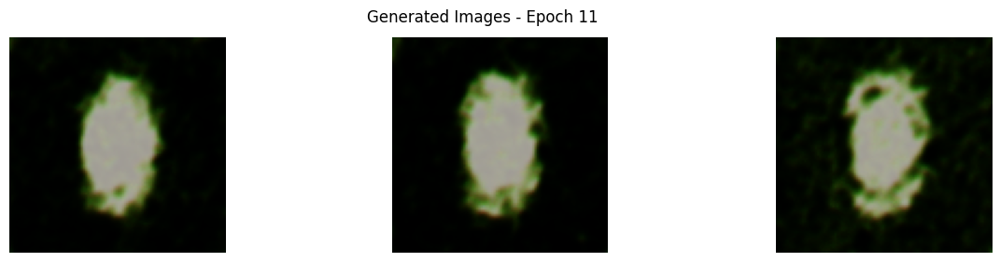

34/34 ━━━━━━━━━━━━━━━━━━━━ 21s 384ms/step - d_loss: 0.2799 - g_loss: 2.0591
Epoch 12/50
34/34 ━━━━━━━━━━━━━━━━━━━━ 0s 378ms/step - d_loss: 0.3017 - g_loss: 1.5513

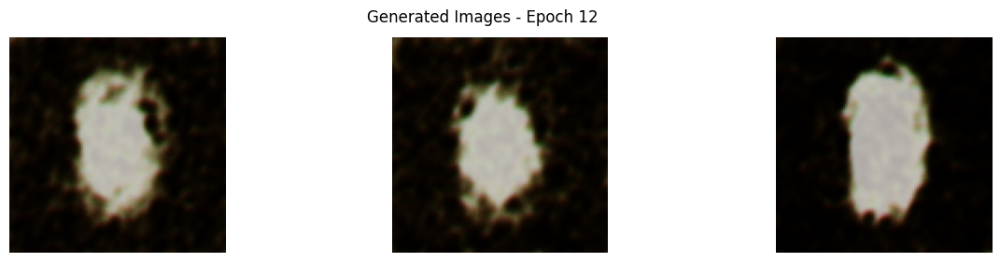

34/34 ━━━━━━━━━━━━━━━━━━━━ 20s 383ms/step - d_loss: 0.3024 - g_loss: 1.5412
Epoch 13/50
34/34 ━━━━━━━━━━━━━━━━━━━━ 0s 379ms/step - d_loss: 0.3319 - g_loss: 0.8375

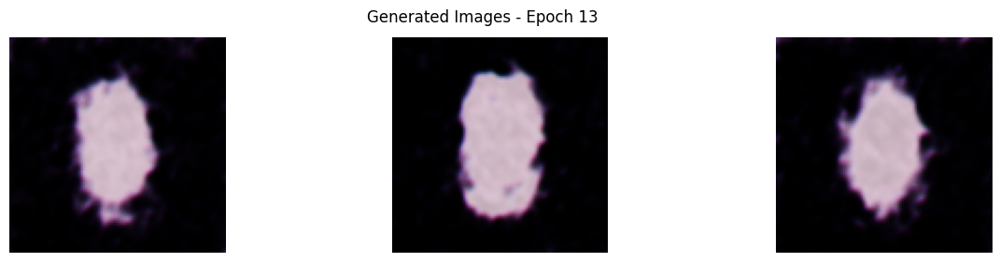

34/34 ━━━━━━━━━━━━━━━━━━━━ 20s 383ms/step - d_loss: 0.3313 - g_loss: 0.8591
Epoch 14/50
34/34 ━━━━━━━━━━━━━━━━━━━━ 0s 384ms/step - d_loss: 0.3349 - g_loss: 0.8761

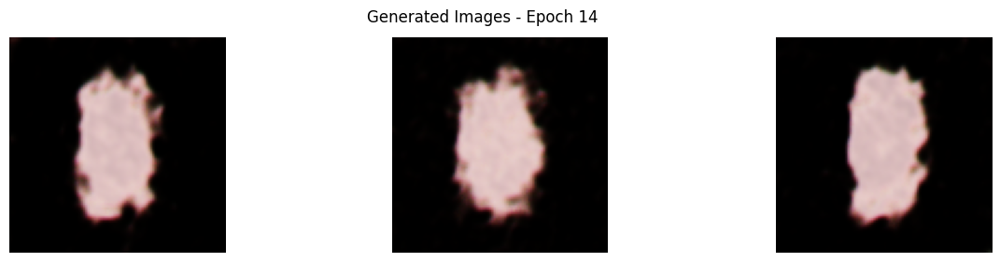

34/34 ━━━━━━━━━━━━━━━━━━━━ 21s 388ms/step - d_loss: 0.3359 - g_loss: 0.8724
Epoch 15/50
34/34 ━━━━━━━━━━━━━━━━━━━━ 0s 381ms/step - d_loss: 0.3681 - g_loss: 0.5977

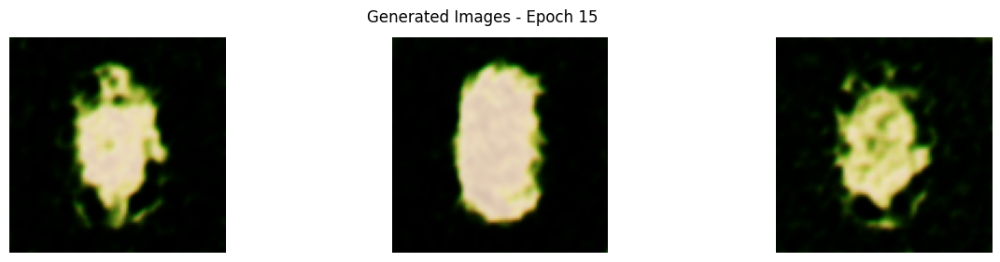

34/34 ━━━━━━━━━━━━━━━━━━━━ 21s 388ms/step - d_loss: 0.3694 - g_loss: 0.6070
Epoch 16/50
34/34 ━━━━━━━━━━━━━━━━━━━━ 0s 384ms/step - d_loss: 0.3432 - g_loss: 0.7807

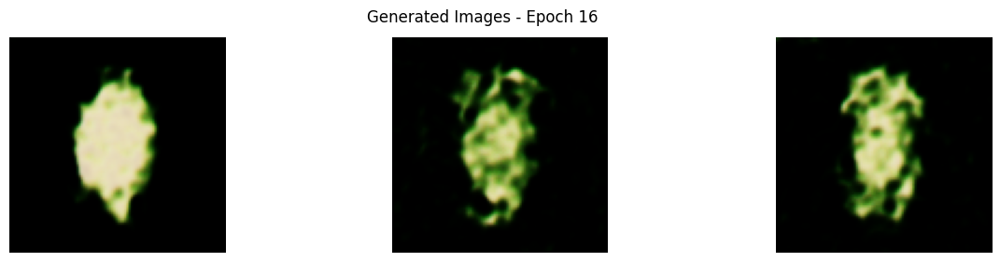

34/34 ━━━━━━━━━━━━━━━━━━━━ 13s 388ms/step - d_loss: 0.3418 - g_loss: 0.8017
Epoch 17/50
34/34 ━━━━━━━━━━━━━━━━━━━━ 0s 385ms/step - d_loss: 0.3588 - g_loss: 0.6653

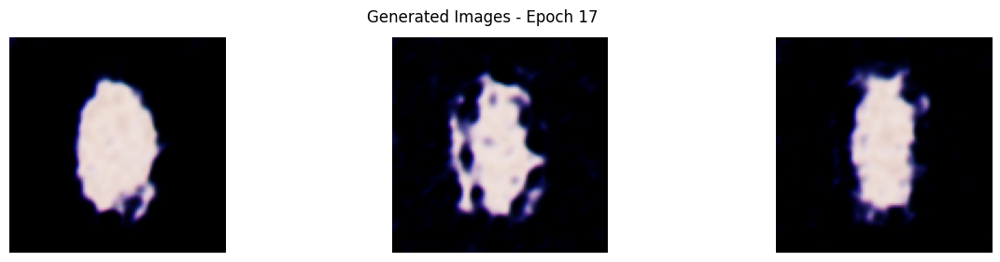

34/34 ━━━━━━━━━━━━━━━━━━━━ 20s 389ms/step - d_loss: 0.3613 - g_loss: 0.6754
Epoch 18/50
34/34 ━━━━━━━━━━━━━━━━━━━━ 0s 382ms/step - d_loss: 0.3558 - g_loss: 0.5895

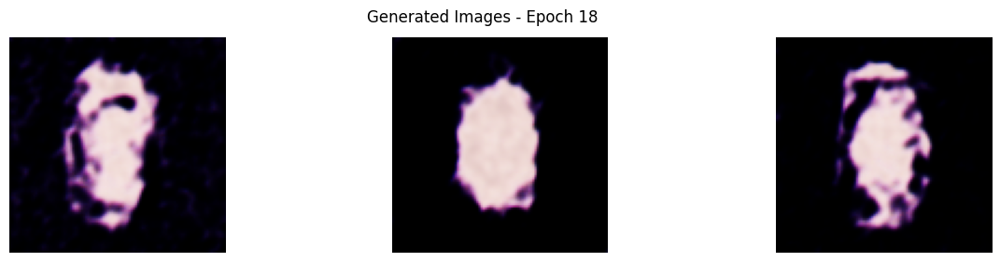

34/34 ━━━━━━━━━━━━━━━━━━━━ 13s 387ms/step - d_loss: 0.3574 - g_loss: 0.5960
Epoch 19/50
34/34 ━━━━━━━━━━━━━━━━━━━━ 0s 386ms/step - d_loss: 0.3495 - g_loss: 0.6924

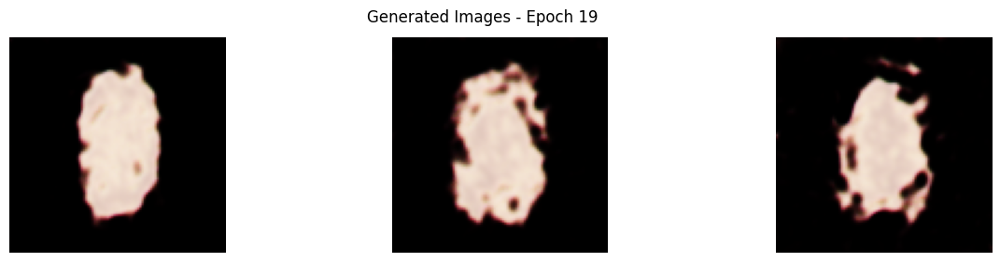

34/34 ━━━━━━━━━━━━━━━━━━━━ 21s 390ms/step - d_loss: 0.3503 - g_loss: 0.6861
Epoch 20/50
34/34 ━━━━━━━━━━━━━━━━━━━━ 0s 386ms/step - d_loss: 0.3354 - g_loss: 0.6958

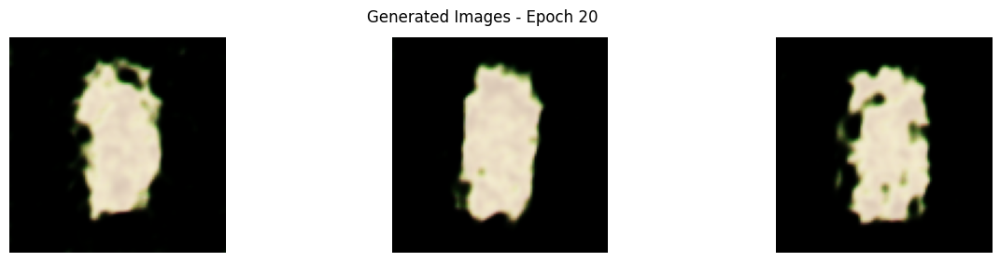

34/34 ━━━━━━━━━━━━━━━━━━━━ 20s 390ms/step - d_loss: 0.3376 - g_loss: 0.7041
Epoch 21/50
34/34 ━━━━━━━━━━━━━━━━━━━━ 0s 388ms/step - d_loss: 0.3482 - g_loss: 0.6556

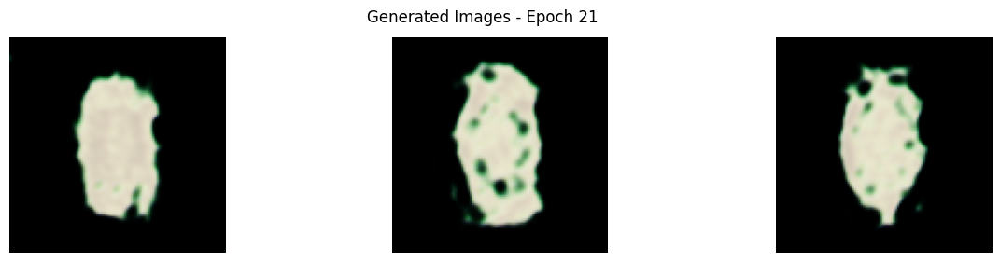

34/34 ━━━━━━━━━━━━━━━━━━━━ 13s 392ms/step - d_loss: 0.3506 - g_loss: 0.6572
Epoch 22/50
34/34 ━━━━━━━━━━━━━━━━━━━━ 0s 387ms/step - d_loss: 0.3375 - g_loss: 0.7700

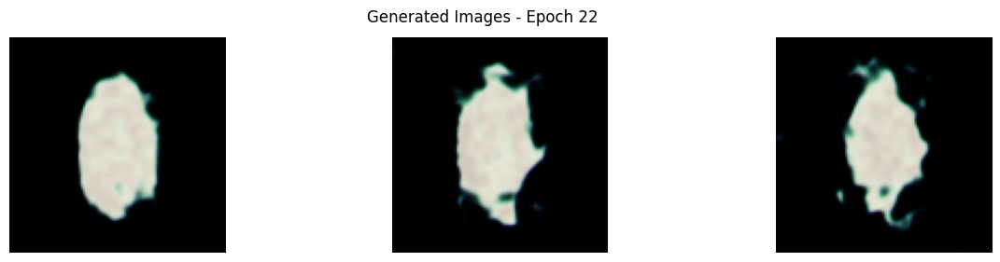

34/34 ━━━━━━━━━━━━━━━━━━━━ 13s 391ms/step - d_loss: 0.3384 - g_loss: 0.8015
Epoch 23/50
34/34 ━━━━━━━━━━━━━━━━━━━━ 0s 389ms/step - d_loss: 0.3283 - g_loss: 0.7435

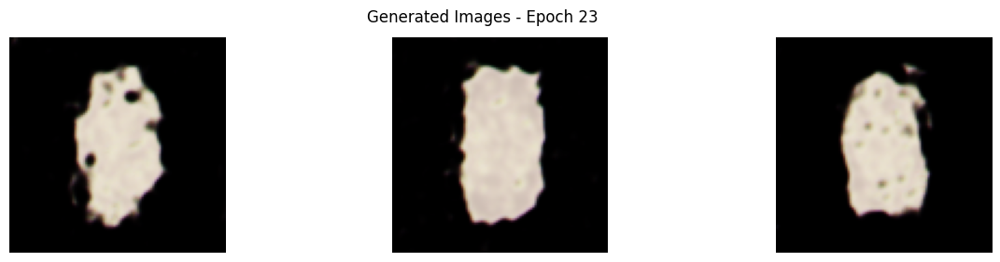

34/34 ━━━━━━━━━━━━━━━━━━━━ 20s 393ms/step - d_loss: 0.3287 - g_loss: 0.7409
Epoch 24/50
34/34 ━━━━━━━━━━━━━━━━━━━━ 0s 390ms/step - d_loss: 0.3293 - g_loss: 0.7189

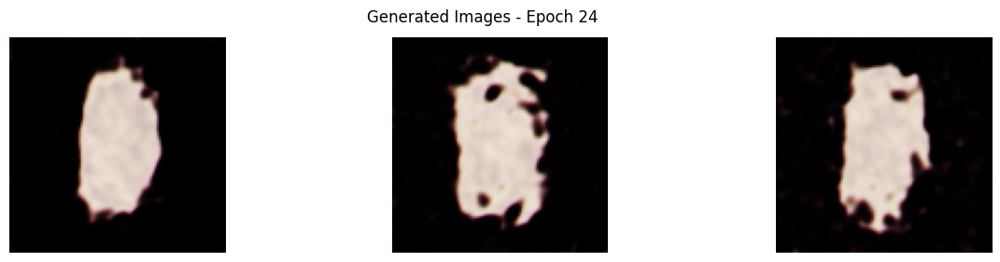

34/34 ━━━━━━━━━━━━━━━━━━━━ 21s 394ms/step - d_loss: 0.3295 - g_loss: 0.7164
Epoch 25/50
34/34 ━━━━━━━━━━━━━━━━━━━━ 0s 389ms/step - d_loss: 0.3326 - g_loss: 0.7744

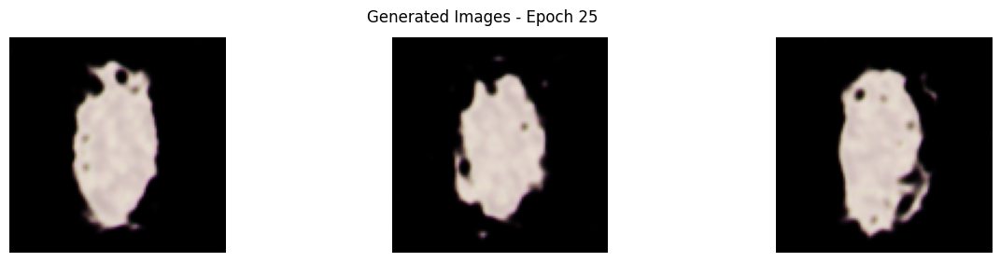

34/34 ━━━━━━━━━━━━━━━━━━━━ 20s 392ms/step - d_loss: 0.3327 - g_loss: 0.7807
Epoch 26/50
34/34 ━━━━━━━━━━━━━━━━━━━━ 0s 390ms/step - d_loss: 0.3281 - g_loss: 0.7338

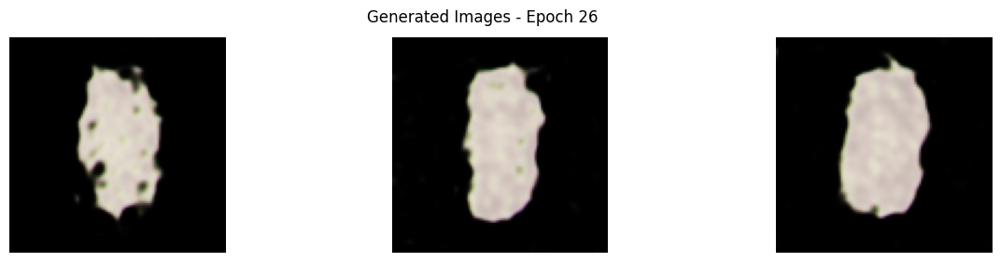

34/34 ━━━━━━━━━━━━━━━━━━━━ 21s 395ms/step - d_loss: 0.3277 - g_loss: 0.7345
Epoch 27/50
34/34 ━━━━━━━━━━━━━━━━━━━━ 0s 391ms/step - d_loss: 0.3294 - g_loss: 0.7848

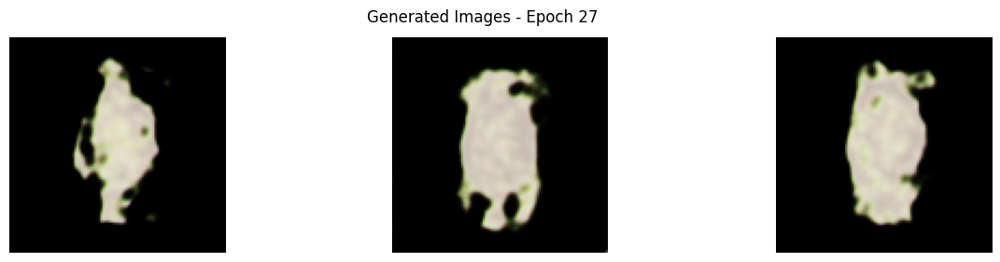

34/34 ━━━━━━━━━━━━━━━━━━━━ 13s 395ms/step - d_loss: 0.3306 - g_loss: 0.8014
Epoch 28/50
34/34 ━━━━━━━━━━━━━━━━━━━━ 0s 391ms/step - d_loss: 0.3415 - g_loss: 0.7542

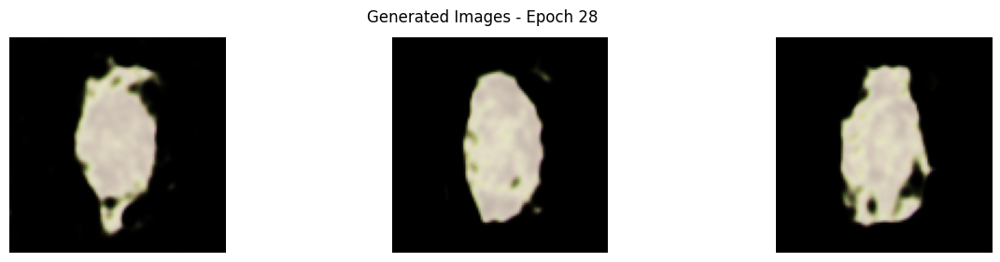

34/34 ━━━━━━━━━━━━━━━━━━━━ 21s 395ms/step - d_loss: 0.3409 - g_loss: 0.7736
Epoch 29/50
34/34 ━━━━━━━━━━━━━━━━━━━━ 0s 392ms/step - d_loss: 0.3382 - g_loss: 0.7417

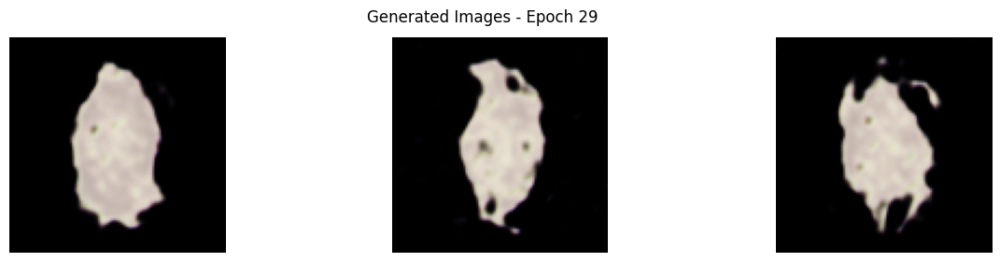

34/34 ━━━━━━━━━━━━━━━━━━━━ 14s 396ms/step - d_loss: 0.3402 - g_loss: 0.7380
Epoch 30/50
34/34 ━━━━━━━━━━━━━━━━━━━━ 0s 394ms/step - d_loss: 0.3350 - g_loss: 0.7584

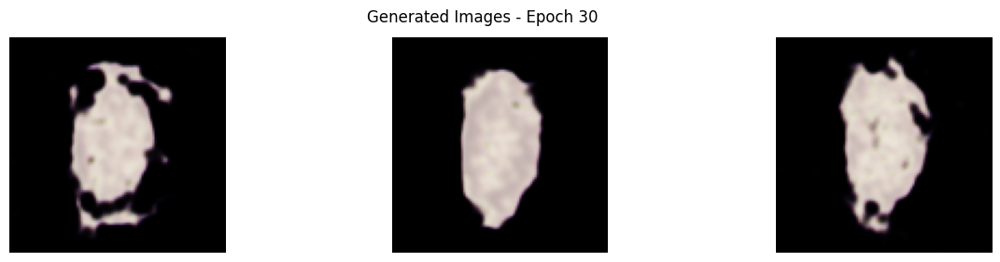

34/34 ━━━━━━━━━━━━━━━━━━━━ 20s 398ms/step - d_loss: 0.3381 - g_loss: 0.7743
Epoch 31/50
34/34 ━━━━━━━━━━━━━━━━━━━━ 0s 391ms/step - d_loss: 0.3289 - g_loss: 0.6760

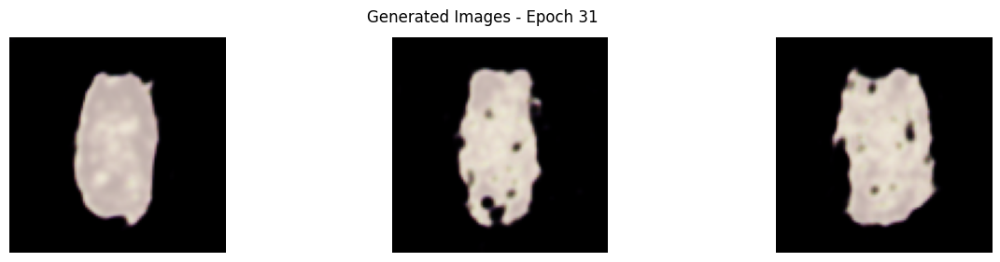

34/34 ━━━━━━━━━━━━━━━━━━━━ 20s 395ms/step - d_loss: 0.3301 - g_loss: 0.6753
Epoch 32/50
34/34 ━━━━━━━━━━━━━━━━━━━━ 0s 394ms/step - d_loss: 0.3323 - g_loss: 0.7705

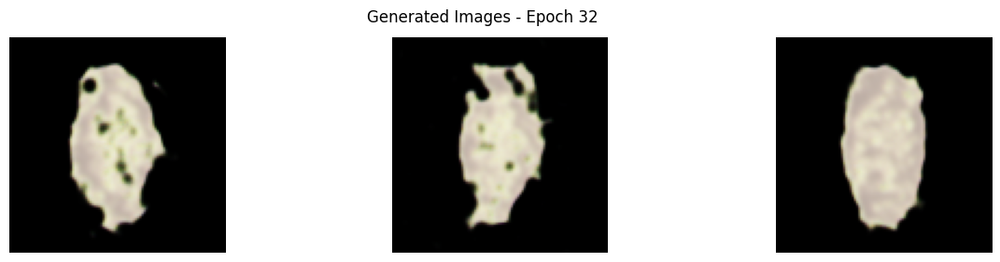

34/34 ━━━━━━━━━━━━━━━━━━━━ 21s 398ms/step - d_loss: 0.3338 - g_loss: 0.7664
Epoch 33/50
34/34 ━━━━━━━━━━━━━━━━━━━━ 0s 404ms/step - d_loss: 0.3411 - g_loss: 0.7240

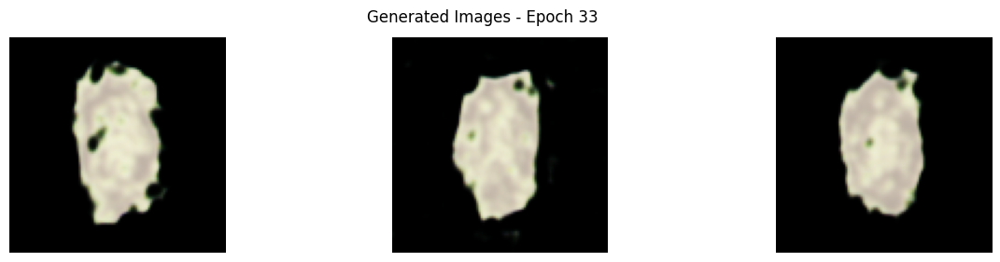

34/34 ━━━━━━━━━━━━━━━━━━━━ 21s 410ms/step - d_loss: 0.3409 - g_loss: 0.7285
Epoch 34/50
34/34 ━━━━━━━━━━━━━━━━━━━━ 0s 396ms/step - d_loss: 0.3465 - g_loss: 0.7305

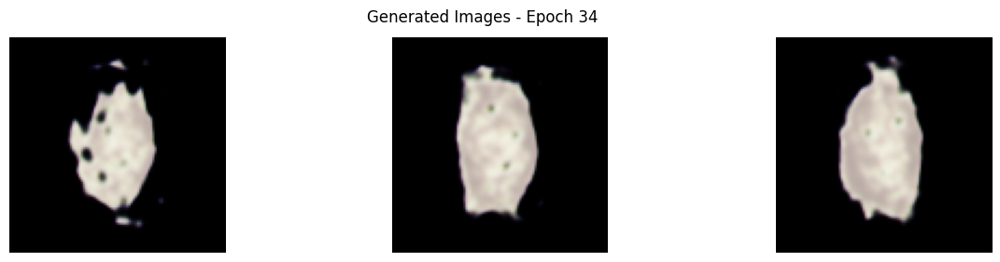

34/34 ━━━━━━━━━━━━━━━━━━━━ 20s 400ms/step - d_loss: 0.3470 - g_loss: 0.7237
Epoch 35/50
34/34 ━━━━━━━━━━━━━━━━━━━━ 0s 394ms/step - d_loss: 0.3462 - g_loss: 0.6186

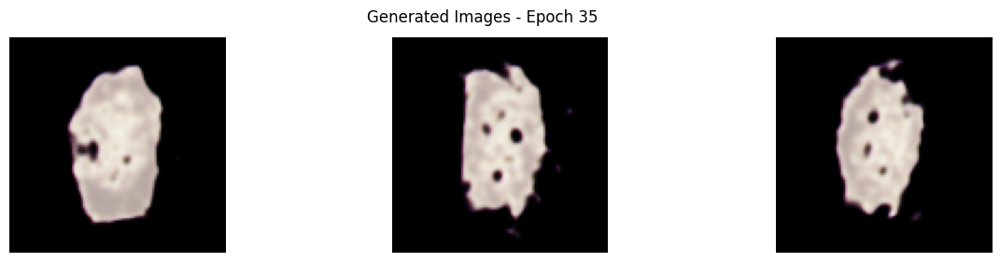

34/34 ━━━━━━━━━━━━━━━━━━━━ 20s 399ms/step - d_loss: 0.3497 - g_loss: 0.6243
Epoch 36/50
34/34 ━━━━━━━━━━━━━━━━━━━━ 0s 403ms/step - d_loss: 0.3432 - g_loss: 0.6117

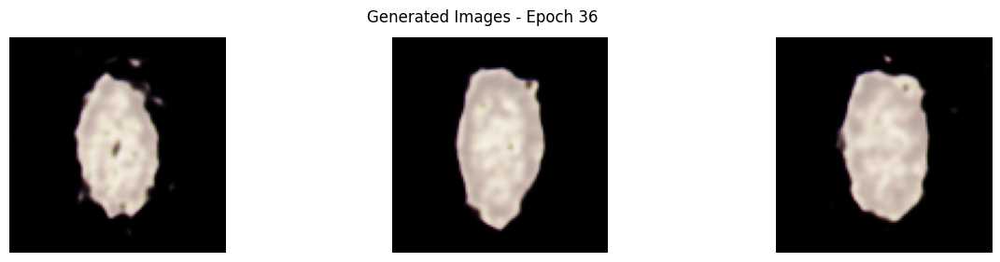

34/34 ━━━━━━━━━━━━━━━━━━━━ 21s 409ms/step - d_loss: 0.3458 - g_loss: 0.6162
Epoch 37/50
34/34 ━━━━━━━━━━━━━━━━━━━━ 0s 398ms/step - d_loss: 0.3497 - g_loss: 0.7211

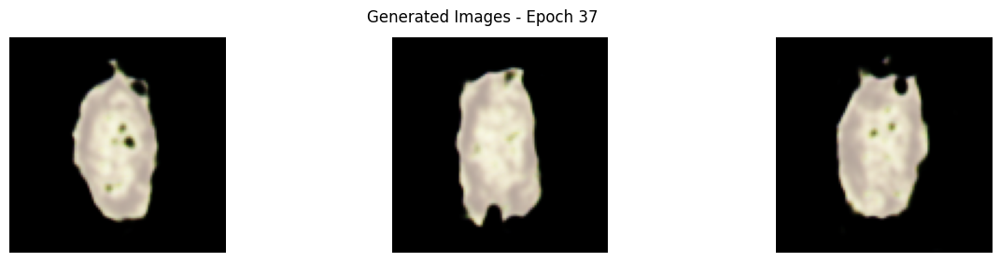

34/34 ━━━━━━━━━━━━━━━━━━━━ 14s 402ms/step - d_loss: 0.3512 - g_loss: 0.7325
Epoch 38/50
34/34 ━━━━━━━━━━━━━━━━━━━━ 0s 398ms/step - d_loss: 0.3311 - g_loss: 0.7267

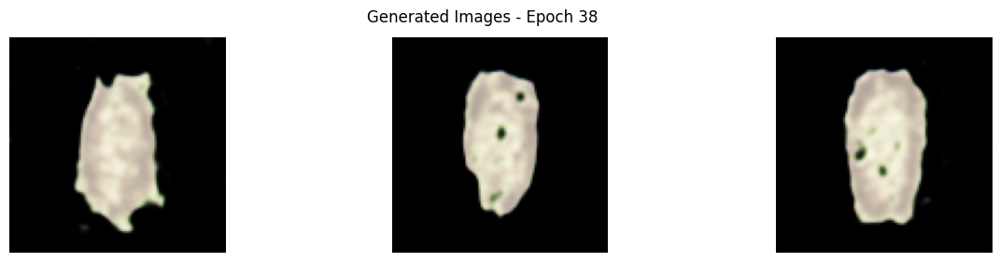

34/34 ━━━━━━━━━━━━━━━━━━━━ 20s 402ms/step - d_loss: 0.3310 - g_loss: 0.7308
Epoch 39/50
34/34 ━━━━━━━━━━━━━━━━━━━━ 0s 396ms/step - d_loss: 0.3309 - g_loss: 0.6514

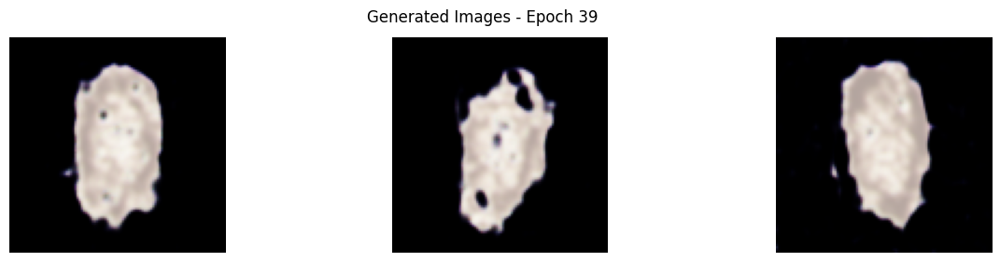

34/34 ━━━━━━━━━━━━━━━━━━━━ 14s 403ms/step - d_loss: 0.3312 - g_loss: 0.6493
Epoch 40/50
34/34 ━━━━━━━━━━━━━━━━━━━━ 0s 401ms/step - d_loss: 0.3311 - g_loss: 0.6869

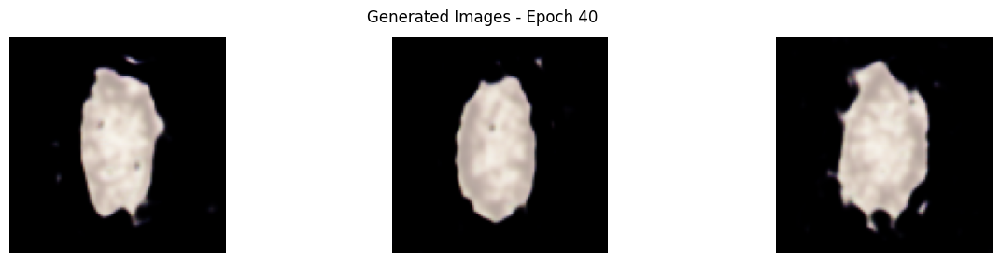

34/34 ━━━━━━━━━━━━━━━━━━━━ 20s 405ms/step - d_loss: 0.3307 - g_loss: 0.6884
Epoch 41/50
34/34 ━━━━━━━━━━━━━━━━━━━━ 0s 400ms/step - d_loss: 0.3336 - g_loss: 0.6925

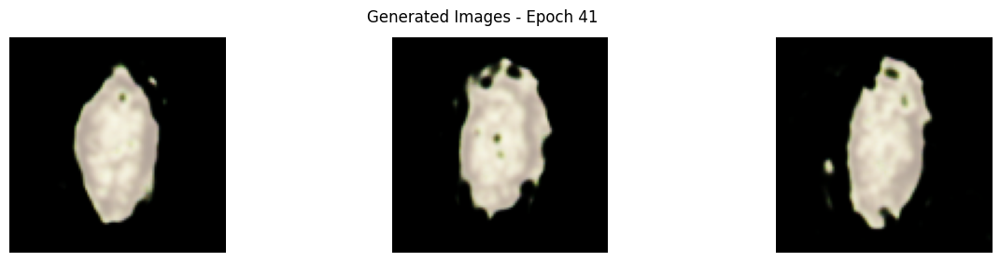

34/34 ━━━━━━━━━━━━━━━━━━━━ 20s 404ms/step - d_loss: 0.3339 - g_loss: 0.6957
Epoch 42/50
34/34 ━━━━━━━━━━━━━━━━━━━━ 0s 411ms/step - d_loss: 0.3323 - g_loss: 0.7103

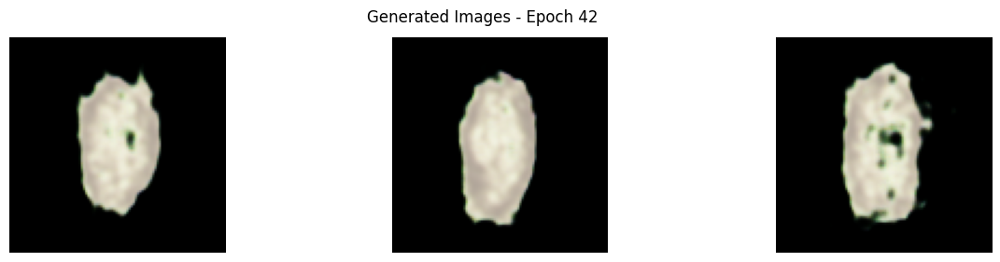

34/34 ━━━━━━━━━━━━━━━━━━━━ 21s 418ms/step - d_loss: 0.3337 - g_loss: 0.7090
Epoch 43/50
34/34 ━━━━━━━━━━━━━━━━━━━━ 0s 401ms/step - d_loss: 0.3320 - g_loss: 0.6761

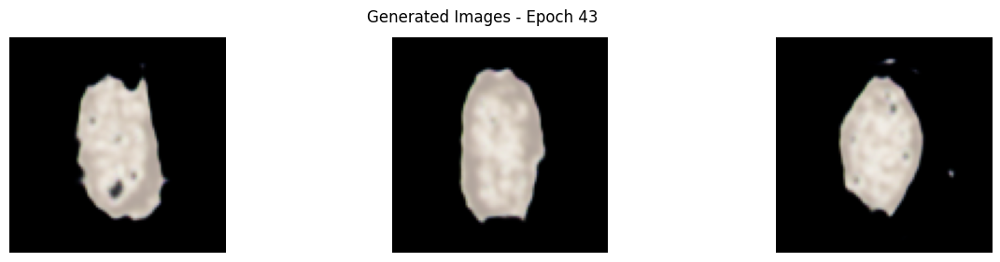

34/34 ━━━━━━━━━━━━━━━━━━━━ 20s 405ms/step - d_loss: 0.3340 - g_loss: 0.6888
Epoch 44/50
34/34 ━━━━━━━━━━━━━━━━━━━━ 0s 402ms/step - d_loss: 0.3385 - g_loss: 0.6800

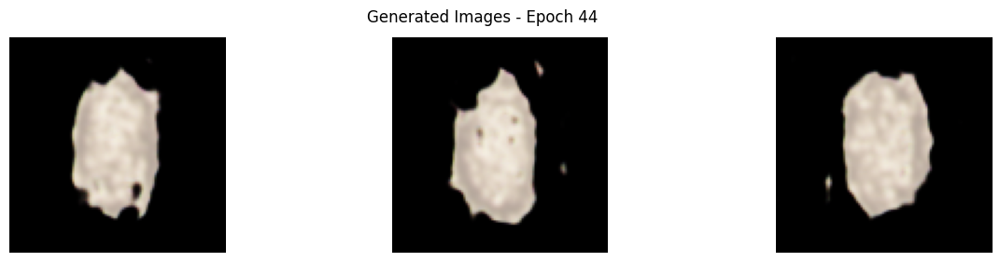

34/34 ━━━━━━━━━━━━━━━━━━━━ 21s 407ms/step - d_loss: 0.3400 - g_loss: 0.6859
Epoch 45/50
34/34 ━━━━━━━━━━━━━━━━━━━━ 0s 412ms/step - d_loss: 0.3353 - g_loss: 0.7662

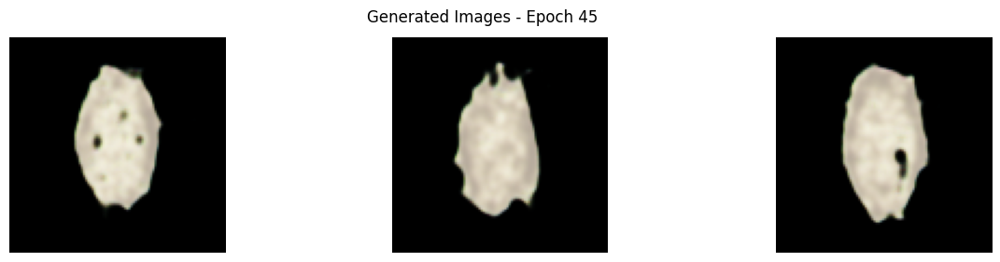

34/34 ━━━━━━━━━━━━━━━━━━━━ 21s 417ms/step - d_loss: 0.3361 - g_loss: 0.7618
Epoch 46/50
34/34 ━━━━━━━━━━━━━━━━━━━━ 0s 403ms/step - d_loss: 0.3297 - g_loss: 0.7029

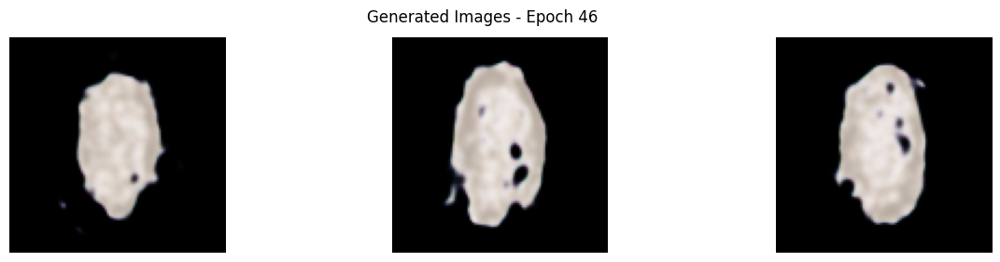

34/34 ━━━━━━━━━━━━━━━━━━━━ 14s 407ms/step - d_loss: 0.3307 - g_loss: 0.7097
Epoch 47/50
34/34 ━━━━━━━━━━━━━━━━━━━━ 0s 401ms/step - d_loss: 0.3416 - g_loss: 0.7122

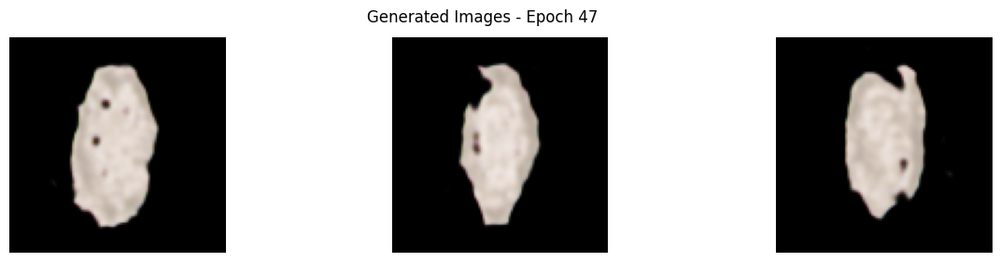

34/34 ━━━━━━━━━━━━━━━━━━━━ 14s 405ms/step - d_loss: 0.3421 - g_loss: 0.7276
Epoch 48/50
34/34 ━━━━━━━━━━━━━━━━━━━━ 0s 402ms/step - d_loss: 0.3464 - g_loss: 0.5958

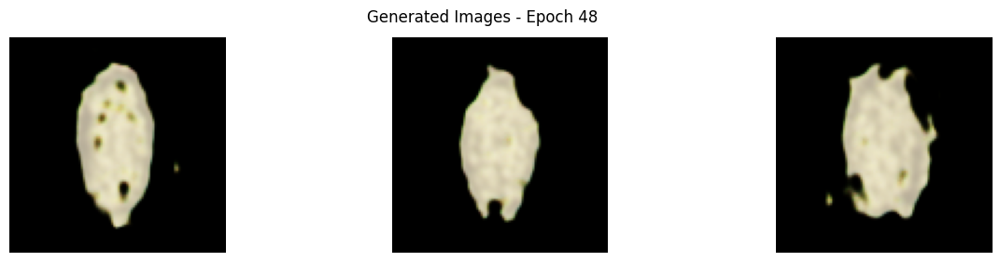

34/34 ━━━━━━━━━━━━━━━━━━━━ 20s 406ms/step - d_loss: 0.3471 - g_loss: 0.5959
Epoch 49/50
34/34 ━━━━━━━━━━━━━━━━━━━━ 0s 412ms/step - d_loss: 0.3291 - g_loss: 0.8366

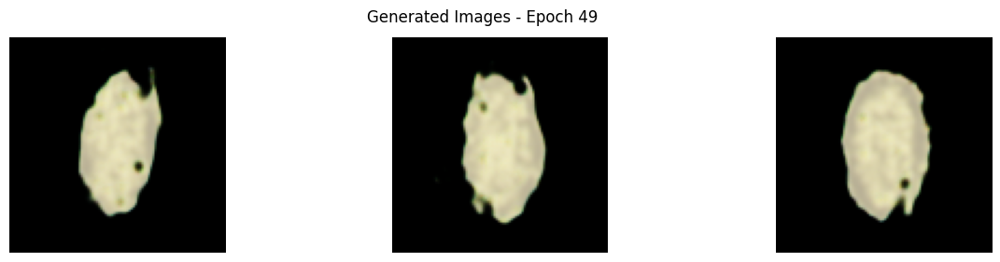

34/34 ━━━━━━━━━━━━━━━━━━━━ 14s 418ms/step - d_loss: 0.3294 - g_loss: 0.8458
Epoch 50/50
34/34 ━━━━━━━━━━━━━━━━━━━━ 0s 404ms/step - d_loss: 0.3583 - g_loss: 0.6692

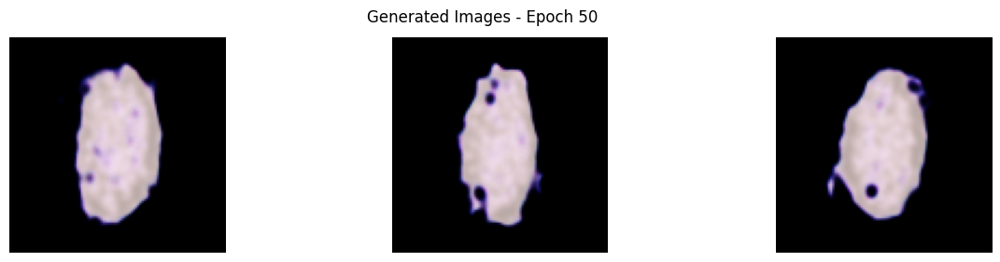

34/34 ━━━━━━━━━━━━━━━━━━━━ 20s 408ms/step - d_loss: 0.3606 - g_loss: 0.6707


In [245]:
history = mod_gan.fit(x, epochs=50, callbacks=[mod_ModelMonitor()])

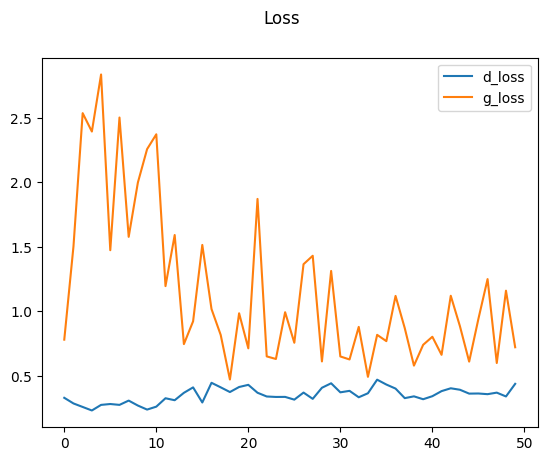

In [252]:
plt.suptitle('Loss')
plt.plot(history.history['d_loss'], label='d_loss')
plt.plot(history.history['g_loss'], label='g_loss')
plt.legend()
plt.show()

### Dloss cukup stabil dari permulaan, nga naik turun secara drastis, berarti discriminator belajar secara konsisten
### awalnya Gloss sangat fluktuatif (tidak stabil), berarti generator masih belum bisa hasilin gambar yang membohongi discriminator, tetapi di dari tengah sampai akhir, mulau turun dan lebih stabil (sedikit), tapi tetap ada fluktuasi
### Overall, model lumayan baik, karena keduanya saling belajar, namun memang Fluktuasi G LOSS ini masih lumayan besar, tidak ada konvergen yang jelas. Konvergen yang jelas itu ditandai dari  G loss dan D loss yang fluktuasinya ada (menandakan ada proses belajar), tapi dalam rentang kecil

In [248]:
# Real images: ambil dari x (data asli)
real_images = x[:100]  # misalnya ambil 100 sample
# Generated images: generate dari noise
noise = tf.random.normal((100, 200))
mod_generated_images = mod_generator(noise, training=False)

fid_score = calculate_fid(real_images, mod_generated_images)
print("FID Score:", fid_score)

4/4 ━━━━━━━━━━━━━━━━━━━━ 19s 4s/step
4/4 ━━━━━━━━━━━━━━━━━━━━ 17s 4s/step
FID Score: 296.5159278392515


### FID ada di angka 296, improvement dari model sebelumnya
### walaupun masih tinggi, dikarenakan epoch yang sedikit, namun tetap ada improvement.
### Beberapa penjelasannya adalah latent dim yang meningkat, sehingga lebih bisa membangun gambar lebih detail dan akurat, lalu juga less complex model yang bisa dibilang mengurangi risiko overfitting

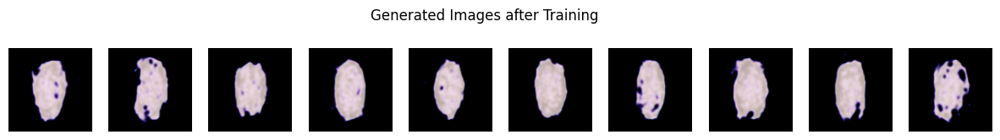

In [249]:
show_generated_images(mod_generated_images, "Generated Images after Training")

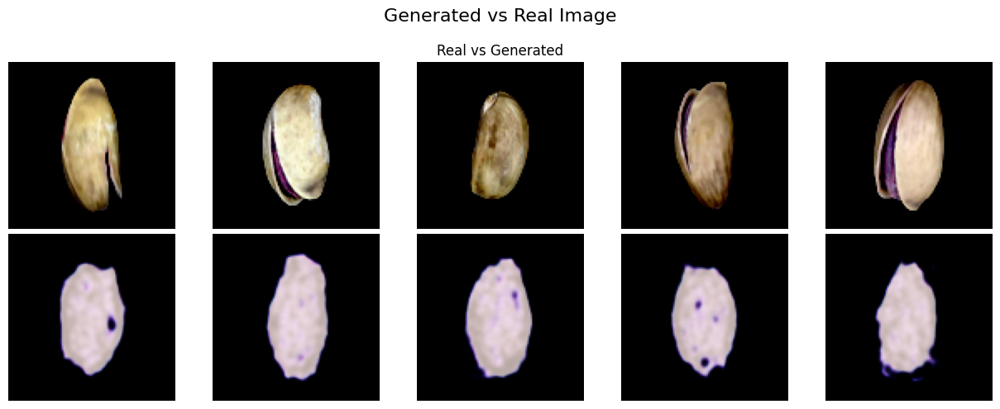

In [251]:
show_real_vs_generated(
    real_images[:5],
    ((mod_generator(tf.random.normal((5, 200))) + 1) / 2).numpy(),
    title="Generated vs Real Image"
)

https://drive.google.com/drive/folders/1_ggwBIIaDgdvG_25tj3mQFZHsJm7EJbI?usp=sharing